In [1]:
import os
from glob import glob

import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import torch.utils.data as data
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import unet_model as UNET
import cv2
import csv
from helper import load_obj
from scipy.spatial.transform import Rotation as R
from numpy.linalg import inv

import numpy as np
from PIL import Image
import warnings
warnings.filterwarnings(action='ignore')
#torch.backends.cudnn.benchmark = False

# Hyperparameter

In [2]:
print('Num_GPU :', torch.cuda.device_count())

no_cuda = False
use_cuda = not no_cuda and torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
Tensor = torch.cuda.FloatTensor if use_cuda else torch.Tensor

params = {
    'batch_size':2 * torch.cuda.device_count(),
    'test_batch_size':2 * torch.cuda.device_count(),
    'input_size':256,
    'resize_scale':280,
    'crop_size':256,
    'fliplr':False,
    'rot':True,
    #model params
    'epoch_count':1,
    'epochs':100,
    'log_interval':1000,
    'lr':0.0003,
    'dataroot':'C:/Users/IVCL/Desktop/crane',
}

Num_GPU : 2


# Utils

In [3]:
def to_np(x):
    return x.data.cpu().numpy()
        
def plot_train_result(test_image, epoch, save=False,  show=True, fig_size=(15, 15)):
    plt.figure(figsize=fig_size)
    imgs = [to_np(test_image[0]), to_np(test_image[1]), test_image[2], to_np(test_image[3]), test_image[4],
           to_np(test_image[5]), test_image[6]]
    title = ["Test Image", "Test Mask", "Predicted Mask", "Test U Mask", "Predicted U Mask", "Test V Mask", "Predicted V Mask"]
        
    plt.subplot(1, 7, 1)
    plt.title(title[0])
    img = imgs[0]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min())).transpose(1, 2, 0).astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 7, 2)
    plt.title(title[1])
    img = imgs[1]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 3)
    plt.title(title[2])
    img = imgs[2]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
    plt.subplot(1, 7, 4)
    plt.title(title[3])
    img = imgs[3]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 5)
    plt.title(title[4])
    img = imgs[4]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 6)
    plt.title(title[5])
    img = imgs[5]
    img = img.squeeze()
    img = (((img - img.min()) * 255) / (img.max() - img.min()))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 7, 7)
    plt.title(title[6])
    img = imgs[6]
    img = img.squeeze()
    img = to_np(torch.argmax(img, dim=0))
    plt.imshow(img, cmap='gray')
    plt.axis('off')
    
    # save figure
    if save:
        save_fn = './img_per_epoch/epoch_{:d}'.format(epoch+1) + '.png'
        fig.savefig(save_fn)

    if show:
        plt.show()
    else:
        plt.close()

# Model

In [4]:
correspondence_block = UNET.UNet(
        n_channels=3, out_channels_id=2, out_channels_uv=256, bilinear=True)
correspondence_block = nn.DataParallel(correspondence_block)
correspondence_block.to(device)

DataParallel(
  (module): UNet(
    (inc): DoubleConv(
      (double_conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (down1): Down(
      (maxpool_conv): Sequential(
        (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (1): DoubleConv(
          (double_conv): Sequential(
            (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
            (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU(inplace=True)
            (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), p

# Preprocess

In [5]:
train_image_paths = glob(params['dataroot'] + '/image_coco_512_aug/*.png')[4001:]
train_mask_paths = glob(params['dataroot'] + '/mask_coco_512/*.png')[4001:]
train_u_mask_paths = glob(params['dataroot'] + '/U_mask_coco_512/*.png')[4001:]
train_v_mask_paths = glob(params['dataroot'] + '/V_mask_coco_512/*.png')[4001:]

val_image_paths = glob(params['dataroot'] + '/image_coco_512_aug/*.png')[:4001]
val_mask_paths = glob(params['dataroot'] + '/mask_coco_512/*.png')[:4001]
val_u_mask_paths = glob(params['dataroot'] + '/U_mask_coco_512/*.png')[:4001]
val_v_mask_paths = glob(params['dataroot'] + '/V_mask_coco_512/*.png')[:4001]

test_image_paths = glob(params['dataroot'] + '/real_image/*.png')
test_mask_paths = glob(params['dataroot'] + '/real_mask/*.png')

In [6]:
class DatasetFromFolder(data.Dataset):
    def __init__(self, image_dir, mask_dir, u_mask_dir, v_mask_dir, transform=None, resize_scale=None, rot=None, crop_size=None,
                 fliplr=False):
        super(DatasetFromFolder, self).__init__()
        self.image_path = image_dir
        self.mask_path = mask_dir
        self.u_mask_path = u_mask_dir
        self.v_mask_path = v_mask_dir
        
        self.transform = transform
        
        self.resize_scale = resize_scale
        self.rot = rot
        self.crop_size = crop_size
        self.fliplr = fliplr

    def __getitem__(self, index):
        # Load Image
        img_fn = self.image_path[index]
        mask_fn = self.mask_path[index]
        u_mask_fn = self.u_mask_path[index]
        v_mask_fn = self.v_mask_path[index]
        
        img = cv2.imread(img_fn)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_fn, cv2.IMREAD_GRAYSCALE)
        u_mask = cv2.imread(u_mask_fn, cv2.IMREAD_GRAYSCALE)
        v_mask = cv2.imread(v_mask_fn, cv2.IMREAD_GRAYSCALE)
        
        seed = random.randint(1, 1000)
        random.seed(seed)
                          
        # preprocessing
        if self.resize_scale:
            img = cv2.resize(img, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            mask = cv2.resize(mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            u_mask = cv2.resize(u_mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
            v_mask = cv2.resize(v_mask, (self.resize_scale, self.resize_scale), cv2.INTER_CUBIC)
                   
        if self.crop_size:
            x = random.randint(0, self.resize_scale - self.crop_size)
            y = random.randint(0, self.resize_scale - self.crop_size)
            img = img[x:x + self.crop_size, y:y + self.crop_size]
            mask = mask[x:x + self.crop_size, y:y + self.crop_size]
            u_mask = u_mask[x:x + self.crop_size, y:y + self.crop_size]
            v_mask = v_mask[x:x + self.crop_size, y:y + self.crop_size]
        
        if self.rot:
            height, width, channel = img.shape
            temp_img = img
            angle = random.randint(-15, 15)
            matrix = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
            img = cv2.warpAffine(img, matrix, (width, height))
            for i in range(height):
                for j in range(width):
                    if img[i,j,0]==0 and img[i,j,1]==0 and img[i,j,2]==0:
                        img[i,j]=temp_img[i,j]
            mask = cv2.warpAffine(mask, matrix, (width, height))
            u_mask = cv2.warpAffine(u_mask, matrix, (width, height))
            v_mask = cv2.warpAffine(v_mask, matrix, (width, height))
        
        if self.fliplr:
            if random.random() < 0.5:
                img = cv2.flip(img, 1)
                mask = cv2.flip(mask, 1)
                u_mask = cv2.flip(u_mask, 1)
                v_mask = cv2.flip(v_mask, 1)
        
        mask = np.where(mask>0,1.0,0)
               
        if self.transform is not None:
            img = self.transform(img)
        else:
            transform = transforms.ToTensor()
            img = transform(img)
        mask = (torch.from_numpy(mask)).type(torch.double)
        u_mask = (torch.from_numpy(u_mask)).type(torch.int64)
        v_mask = (torch.from_numpy(v_mask)).type(torch.int64)        
        
        return img, mask, u_mask, v_mask
                                              
    def __len__(self):
        return len(self.image_path)

In [7]:
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.ToPILImage(),
                                transforms.ColorJitter(brightness=(0.2,1), contrast=(0.3,2), saturation=(0.2,2), hue=(-0.1,0.1)),
                                transforms.ToTensor()])

train_data = DatasetFromFolder(train_image_paths, train_mask_paths, train_u_mask_paths, train_v_mask_paths, transform=transform,
                               resize_scale=params['resize_scale'], rot=params['rot'], crop_size=params['crop_size'],
                               fliplr=params['fliplr'])
train_data_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=params['batch_size'], shuffle=True)

val_data = DatasetFromFolder(val_image_paths, val_mask_paths, val_u_mask_paths, val_v_mask_paths, transform=None,
                             resize_scale=params['input_size'])
val_data_loader = torch.utils.data.DataLoader(dataset=val_data, batch_size=params['test_batch_size'], shuffle=False)

In [8]:
for i, (data, mask, u_mask, v_mask) in enumerate(train_data_loader):
    if i == 0:
        print(data[0].shape, mask[0].shape, u_mask[0].shape, v_mask[0].shape)
        break

torch.Size([3, 256, 256]) torch.Size([256, 256]) torch.Size([256, 256]) torch.Size([256, 256])


(-0.5, 255.5, 255.5, -0.5)

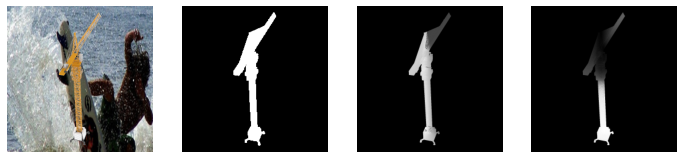

In [12]:
# Get specific val images
val_image, val_mask, val_u_mask, val_v_mask = val_data.__getitem__(5) # Convert to 4d tensor (BxNxHxW)
val_image = val_image.unsqueeze(0)

val_data_image = ((val_image - val_image.min()) / (val_image.max() - val_image.min()))

plt.figure(figsize=(12,12))
plt.subplot(1,4,1)
plt.imshow(val_data_image[0].permute(1,2,0))
plt.axis('off')
plt.subplot(1,4,2)
plt.imshow(val_mask,'gray')
plt.axis('off')
plt.subplot(1,4,3)
plt.imshow(val_u_mask,'gray')
plt.axis('off')
plt.subplot(1,4,4)
plt.imshow(val_v_mask,'gray')
plt.axis('off')

# Optimization

In [13]:
# setup optimizer
optimizer = optim.Adam(correspondence_block.parameters(), lr=params['lr'], weight_decay=3e-5)
criterion_m = nn.CrossEntropyLoss()
criterion_u = nn.CrossEntropyLoss()
criterion_v = nn.CrossEntropyLoss()

# Visualization

In [14]:
def visualization(model, test_path):
    model.eval()
    model.to(device)
    transform = transforms.Compose([transforms.ToTensor(),
                                transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0)])

    image = cv2.imread(test_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
    image= transform(image).unsqueeze_(0)
    mask, u_mask, v_mask = model(image)

    mask = mask.squeeze()
    mask_out = to_np(torch.argmax(mask, dim=0))
    
    u_mask = u_mask.squeeze()
    u_mask_out = to_np(torch.argmax(u_mask, dim=0))   
    
    v_mask = v_mask.squeeze()
    v_mask_out = to_np(torch.argmax(v_mask, dim=0)) 
    
    test_image = plt.imread(test_path)
    
    plt.figure(figsize=(12,12))
    display_list = [test_image, mask_out, u_mask_out, v_mask_out]
    title = ['Input Image', 'Predicted Mask', 'Predicted U Mask', 'Predicted V Mask']
       
    plt.subplot(1, 4, 1)
    plt.title(title[0])
    plt.imshow(display_list[0])
    plt.axis('off')
        
    plt.subplot(1, 4, 2)
    plt.title(title[1])
    plt.imshow(display_list[1], 'gray')
    plt.axis('off')
    
    plt.subplot(1, 4, 3)
    plt.title(title[2])
    plt.imshow(display_list[2], 'gray')
    plt.axis('off')
    
    plt.subplot(1, 4, 4)
    plt.title(title[3])
    plt.imshow(display_list[3], 'gray')
    plt.axis('off') 
    
    plt.show()

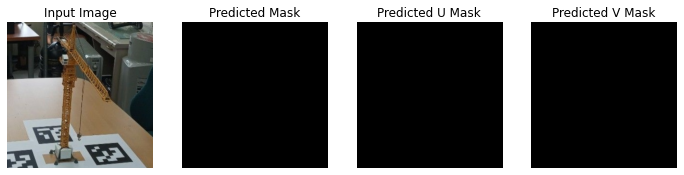

In [15]:
test_path = 'C:/Users/IVCL/Desktop/crane/real_image_crop/creal_0065.png'
visualization(correspondence_block, test_path)

# Training

In [16]:
checkpoint_path = './checkpoints/cpb_unet_aug_flipX'

===> Epoch[1/100](0/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3696	Loss_V_Mask: 0.3227
===> Epoch[1/100](1000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3253	Loss_V_Mask: 0.2687
===> Epoch[1/100](2000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3863	Loss_V_Mask: 0.3128
===> Epoch[1/100](3000/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.3592	Loss_V_Mask: 0.3004
===> Epoch[1/100](4000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3744	Loss_V_Mask: 0.3048
===> Epoch[1/100](5000/5000): Loss_Mask: 0.0181	Loss_U_Mask: 0.3776	Loss_V_Mask: 0.3395
Val_Loss_Mask: 0.0292	Val_U_Loss_Mask: 0.3878	Val_V_Loss_Mask: 0.3688


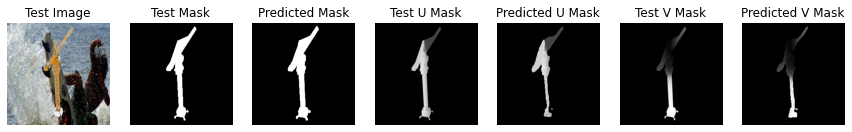

===> Epoch[2/100](0/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3764	Loss_V_Mask: 0.3336
===> Epoch[2/100](1000/5000): Loss_Mask: 0.0157	Loss_U_Mask: 0.3673	Loss_V_Mask: 0.3375
===> Epoch[2/100](2000/5000): Loss_Mask: 0.0156	Loss_U_Mask: 0.3422	Loss_V_Mask: 0.2913
===> Epoch[2/100](3000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3704	Loss_V_Mask: 0.3101
===> Epoch[2/100](4000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3067	Loss_V_Mask: 0.2899
===> Epoch[2/100](5000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3278	Loss_V_Mask: 0.2770
Val_Loss_Mask: 0.0272	Val_U_Loss_Mask: 0.3915	Val_V_Loss_Mask: 0.3814


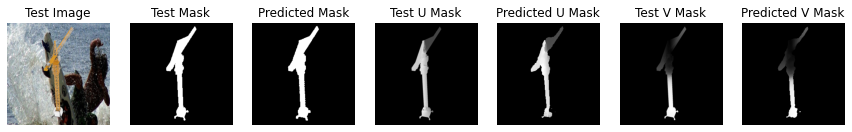

===> Epoch[3/100](0/5000): Loss_Mask: 0.0179	Loss_U_Mask: 0.5079	Loss_V_Mask: 0.4537
===> Epoch[3/100](1000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3975	Loss_V_Mask: 0.3457
===> Epoch[3/100](2000/5000): Loss_Mask: 0.0222	Loss_U_Mask: 0.4213	Loss_V_Mask: 0.3618
===> Epoch[3/100](3000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3667	Loss_V_Mask: 0.3009
===> Epoch[3/100](4000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3772	Loss_V_Mask: 0.3241
===> Epoch[3/100](5000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3194	Loss_V_Mask: 0.2744
Val_Loss_Mask: 0.0264	Val_U_Loss_Mask: 0.3853	Val_V_Loss_Mask: 0.3715


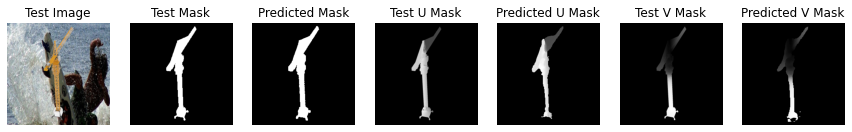

===> Epoch[4/100](0/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3446	Loss_V_Mask: 0.2981
===> Epoch[4/100](1000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3723	Loss_V_Mask: 0.3050
===> Epoch[4/100](2000/5000): Loss_Mask: 0.0171	Loss_U_Mask: 0.3204	Loss_V_Mask: 0.2802
===> Epoch[4/100](3000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3487	Loss_V_Mask: 0.3276
===> Epoch[4/100](4000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.3476	Loss_V_Mask: 0.3189
===> Epoch[4/100](5000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.3341	Loss_V_Mask: 0.2920
Val_Loss_Mask: 0.0293	Val_U_Loss_Mask: 0.3836	Val_V_Loss_Mask: 0.3700


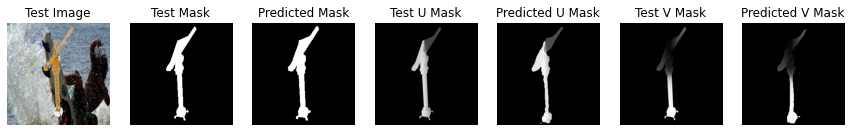

===> Epoch[5/100](0/5000): Loss_Mask: 0.0173	Loss_U_Mask: 0.4131	Loss_V_Mask: 0.3783
===> Epoch[5/100](1000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3471	Loss_V_Mask: 0.2953
===> Epoch[5/100](2000/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3472	Loss_V_Mask: 0.3132
===> Epoch[5/100](3000/5000): Loss_Mask: 0.0216	Loss_U_Mask: 0.4158	Loss_V_Mask: 0.3678
===> Epoch[5/100](4000/5000): Loss_Mask: 0.0155	Loss_U_Mask: 0.3663	Loss_V_Mask: 0.3304
===> Epoch[5/100](5000/5000): Loss_Mask: 0.0230	Loss_U_Mask: 0.4544	Loss_V_Mask: 0.3955
Val_Loss_Mask: 0.0261	Val_U_Loss_Mask: 0.3915	Val_V_Loss_Mask: 0.3801


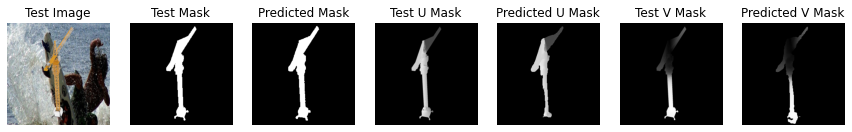

===> Epoch[6/100](0/5000): Loss_Mask: 0.0213	Loss_U_Mask: 0.4970	Loss_V_Mask: 0.5044
===> Epoch[6/100](1000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3754	Loss_V_Mask: 0.3424
===> Epoch[6/100](2000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.4692	Loss_V_Mask: 0.4334
===> Epoch[6/100](3000/5000): Loss_Mask: 0.0169	Loss_U_Mask: 0.4114	Loss_V_Mask: 0.3573
===> Epoch[6/100](4000/5000): Loss_Mask: 0.0212	Loss_U_Mask: 0.4230	Loss_V_Mask: 0.3954
===> Epoch[6/100](5000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3983	Loss_V_Mask: 0.3478
Val_Loss_Mask: 0.0283	Val_U_Loss_Mask: 0.4032	Val_V_Loss_Mask: 0.3963


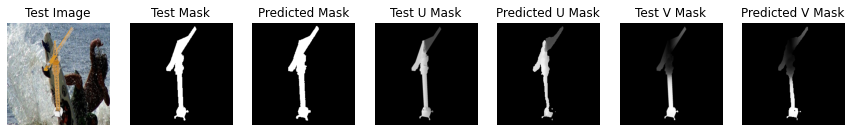

===> Epoch[7/100](0/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3731	Loss_V_Mask: 0.2935
===> Epoch[7/100](1000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3408	Loss_V_Mask: 0.2996
===> Epoch[7/100](2000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.4209	Loss_V_Mask: 0.3455
===> Epoch[7/100](3000/5000): Loss_Mask: 0.0186	Loss_U_Mask: 0.3925	Loss_V_Mask: 0.3360
===> Epoch[7/100](4000/5000): Loss_Mask: 0.0277	Loss_U_Mask: 0.3631	Loss_V_Mask: 0.3351
===> Epoch[7/100](5000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3236	Loss_V_Mask: 0.2701
Val_Loss_Mask: 0.0343	Val_U_Loss_Mask: 0.4098	Val_V_Loss_Mask: 0.3964


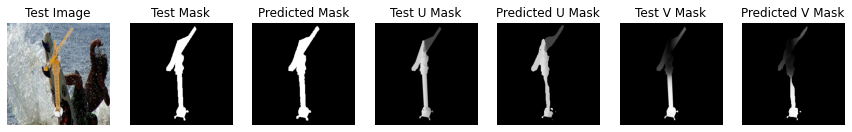

===> Epoch[8/100](0/5000): Loss_Mask: 0.0265	Loss_U_Mask: 0.3690	Loss_V_Mask: 0.3313
===> Epoch[8/100](1000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3672	Loss_V_Mask: 0.3119
===> Epoch[8/100](2000/5000): Loss_Mask: 0.0432	Loss_U_Mask: 0.4286	Loss_V_Mask: 0.4043
===> Epoch[8/100](3000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.2793	Loss_V_Mask: 0.2484
===> Epoch[8/100](4000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3379	Loss_V_Mask: 0.2626
===> Epoch[8/100](5000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3901	Loss_V_Mask: 0.3379
Val_Loss_Mask: 0.0285	Val_U_Loss_Mask: 0.3986	Val_V_Loss_Mask: 0.3888


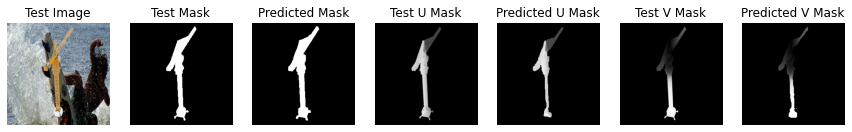

===> Epoch[9/100](0/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.4405	Loss_V_Mask: 0.3960
===> Epoch[9/100](1000/5000): Loss_Mask: 0.0171	Loss_U_Mask: 0.3232	Loss_V_Mask: 0.2609
===> Epoch[9/100](2000/5000): Loss_Mask: 0.0220	Loss_U_Mask: 0.3938	Loss_V_Mask: 0.3335
===> Epoch[9/100](3000/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3313	Loss_V_Mask: 0.2723
===> Epoch[9/100](4000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.3344	Loss_V_Mask: 0.3066
===> Epoch[9/100](5000/5000): Loss_Mask: 0.0135	Loss_U_Mask: 0.3507	Loss_V_Mask: 0.2683
Val_Loss_Mask: 0.0254	Val_U_Loss_Mask: 0.3877	Val_V_Loss_Mask: 0.3725


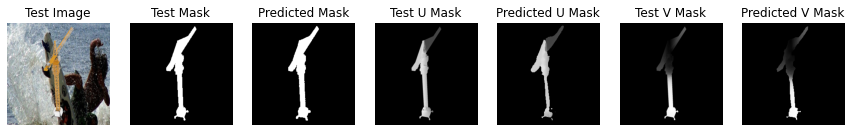

===> Epoch[10/100](0/5000): Loss_Mask: 0.0261	Loss_U_Mask: 0.3997	Loss_V_Mask: 0.3909
===> Epoch[10/100](1000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.4210	Loss_V_Mask: 0.3786
===> Epoch[10/100](2000/5000): Loss_Mask: 0.0263	Loss_U_Mask: 0.3913	Loss_V_Mask: 0.3179
===> Epoch[10/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3505	Loss_V_Mask: 0.2814
===> Epoch[10/100](4000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3038	Loss_V_Mask: 0.2768
===> Epoch[10/100](5000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3951	Loss_V_Mask: 0.3468
Val_Loss_Mask: 0.0260	Val_U_Loss_Mask: 0.3811	Val_V_Loss_Mask: 0.3564


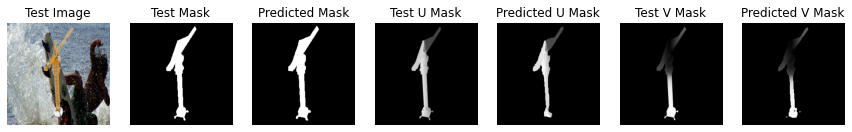

===> Epoch[11/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3218	Loss_V_Mask: 0.2772
===> Epoch[11/100](1000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3893	Loss_V_Mask: 0.3327
===> Epoch[11/100](2000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3430	Loss_V_Mask: 0.2937
===> Epoch[11/100](3000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.4147	Loss_V_Mask: 0.3606
===> Epoch[11/100](4000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3131	Loss_V_Mask: 0.2678
===> Epoch[11/100](5000/5000): Loss_Mask: 0.0189	Loss_U_Mask: 0.3973	Loss_V_Mask: 0.3681
Val_Loss_Mask: 0.0255	Val_U_Loss_Mask: 0.4142	Val_V_Loss_Mask: 0.3949


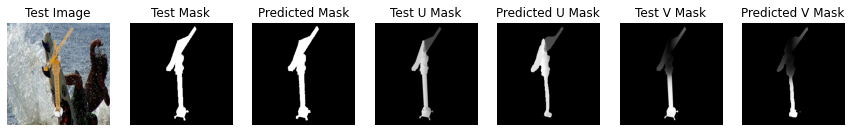

===> Epoch[12/100](0/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3937	Loss_V_Mask: 0.3262
===> Epoch[12/100](1000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3324	Loss_V_Mask: 0.2905
===> Epoch[12/100](2000/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3855	Loss_V_Mask: 0.3477
===> Epoch[12/100](3000/5000): Loss_Mask: 0.0186	Loss_U_Mask: 0.3791	Loss_V_Mask: 0.3590
===> Epoch[12/100](4000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3359	Loss_V_Mask: 0.2738
===> Epoch[12/100](5000/5000): Loss_Mask: 0.0177	Loss_U_Mask: 0.3782	Loss_V_Mask: 0.3331
Val_Loss_Mask: 0.0257	Val_U_Loss_Mask: 0.3954	Val_V_Loss_Mask: 0.3822


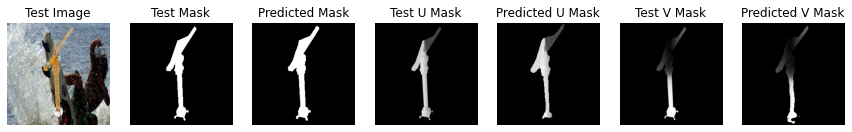

===> Epoch[13/100](0/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3578	Loss_V_Mask: 0.3078
===> Epoch[13/100](1000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3319	Loss_V_Mask: 0.3108
===> Epoch[13/100](2000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3734	Loss_V_Mask: 0.3164
===> Epoch[13/100](3000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.4085	Loss_V_Mask: 0.3520
===> Epoch[13/100](4000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3158	Loss_V_Mask: 0.2948
===> Epoch[13/100](5000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3526	Loss_V_Mask: 0.3059
Val_Loss_Mask: 0.0306	Val_U_Loss_Mask: 0.3959	Val_V_Loss_Mask: 0.3754


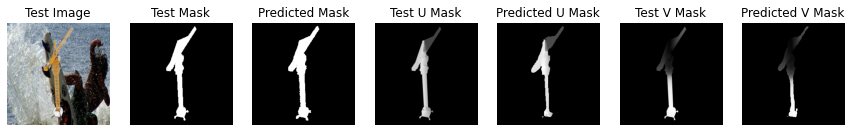

===> Epoch[14/100](0/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3561	Loss_V_Mask: 0.3289
===> Epoch[14/100](1000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3705	Loss_V_Mask: 0.3165
===> Epoch[14/100](2000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3273	Loss_V_Mask: 0.2777
===> Epoch[14/100](3000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3549	Loss_V_Mask: 0.2938
===> Epoch[14/100](4000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3273	Loss_V_Mask: 0.2879
===> Epoch[14/100](5000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.2486	Loss_V_Mask: 0.2291
Val_Loss_Mask: 0.0288	Val_U_Loss_Mask: 0.4127	Val_V_Loss_Mask: 0.4049


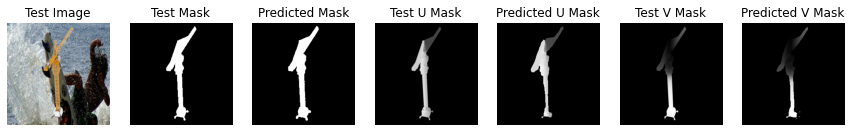

===> Epoch[15/100](0/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.4498	Loss_V_Mask: 0.3758
===> Epoch[15/100](1000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3571	Loss_V_Mask: 0.3053
===> Epoch[15/100](2000/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.4035	Loss_V_Mask: 0.3592
===> Epoch[15/100](3000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3223	Loss_V_Mask: 0.2645
===> Epoch[15/100](4000/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3812	Loss_V_Mask: 0.3381
===> Epoch[15/100](5000/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3356	Loss_V_Mask: 0.2915
Val_Loss_Mask: 0.0284	Val_U_Loss_Mask: 0.3990	Val_V_Loss_Mask: 0.3887


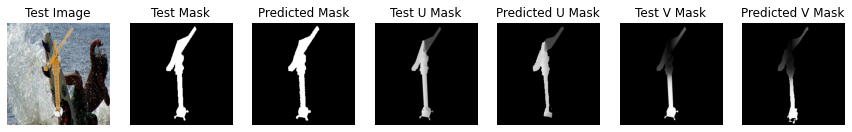

===> Epoch[16/100](0/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3429	Loss_V_Mask: 0.3043
===> Epoch[16/100](1000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3318	Loss_V_Mask: 0.2708
===> Epoch[16/100](2000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3601	Loss_V_Mask: 0.2973
===> Epoch[16/100](3000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3685	Loss_V_Mask: 0.3061
===> Epoch[16/100](4000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.3765	Loss_V_Mask: 0.3261
===> Epoch[16/100](5000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3364	Loss_V_Mask: 0.3060
Val_Loss_Mask: 0.0295	Val_U_Loss_Mask: 0.3992	Val_V_Loss_Mask: 0.3844


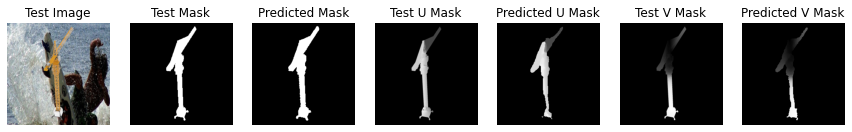

===> Epoch[17/100](0/5000): Loss_Mask: 0.0180	Loss_U_Mask: 0.3163	Loss_V_Mask: 0.2860
===> Epoch[17/100](1000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3479	Loss_V_Mask: 0.2791
===> Epoch[17/100](2000/5000): Loss_Mask: 0.0186	Loss_U_Mask: 0.4658	Loss_V_Mask: 0.4054
===> Epoch[17/100](3000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.4028	Loss_V_Mask: 0.3631
===> Epoch[17/100](4000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.2971	Loss_V_Mask: 0.2472
===> Epoch[17/100](5000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3097	Loss_V_Mask: 0.2512
Val_Loss_Mask: 0.0270	Val_U_Loss_Mask: 0.3994	Val_V_Loss_Mask: 0.3867


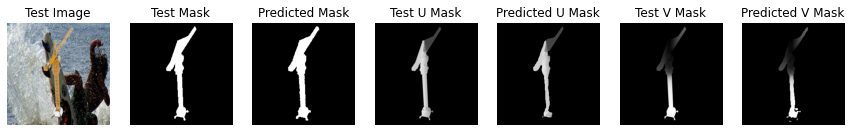

===> Epoch[18/100](0/5000): Loss_Mask: 0.0222	Loss_U_Mask: 0.3469	Loss_V_Mask: 0.3350
===> Epoch[18/100](1000/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3258	Loss_V_Mask: 0.2731
===> Epoch[18/100](2000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.4504	Loss_V_Mask: 0.3991
===> Epoch[18/100](3000/5000): Loss_Mask: 0.0176	Loss_U_Mask: 0.3924	Loss_V_Mask: 0.3610
===> Epoch[18/100](4000/5000): Loss_Mask: 0.0190	Loss_U_Mask: 0.3665	Loss_V_Mask: 0.3335
===> Epoch[18/100](5000/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3636	Loss_V_Mask: 0.3119
Val_Loss_Mask: 0.0306	Val_U_Loss_Mask: 0.4013	Val_V_Loss_Mask: 0.3920


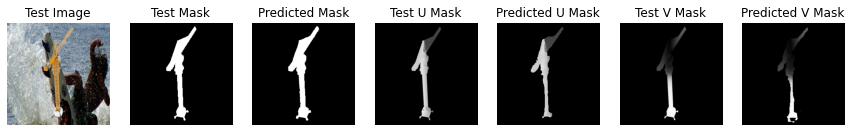

===> Epoch[19/100](0/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3513	Loss_V_Mask: 0.3082
===> Epoch[19/100](1000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3187	Loss_V_Mask: 0.2896
===> Epoch[19/100](2000/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.4035	Loss_V_Mask: 0.3572
===> Epoch[19/100](3000/5000): Loss_Mask: 0.0164	Loss_U_Mask: 0.3315	Loss_V_Mask: 0.2724
===> Epoch[19/100](4000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3241	Loss_V_Mask: 0.2998
===> Epoch[19/100](5000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.4300	Loss_V_Mask: 0.3784
Val_Loss_Mask: 0.0354	Val_U_Loss_Mask: 0.4036	Val_V_Loss_Mask: 0.3924


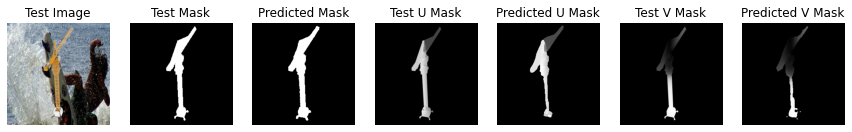

===> Epoch[20/100](0/5000): Loss_Mask: 0.0254	Loss_U_Mask: 0.4380	Loss_V_Mask: 0.4007
===> Epoch[20/100](1000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3356	Loss_V_Mask: 0.2971
===> Epoch[20/100](2000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3412	Loss_V_Mask: 0.2774
===> Epoch[20/100](3000/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3459	Loss_V_Mask: 0.2959
===> Epoch[20/100](4000/5000): Loss_Mask: 0.0164	Loss_U_Mask: 0.3270	Loss_V_Mask: 0.2872
===> Epoch[20/100](5000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3037	Loss_V_Mask: 0.2638
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.3964	Val_V_Loss_Mask: 0.3773


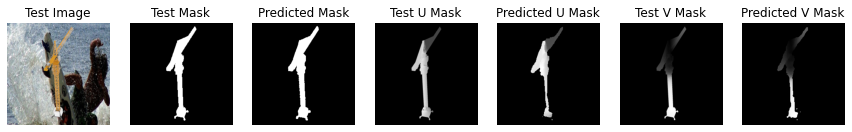

===> Epoch[21/100](0/5000): Loss_Mask: 0.0194	Loss_U_Mask: 0.4458	Loss_V_Mask: 0.4078
===> Epoch[21/100](1000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3579	Loss_V_Mask: 0.3114
===> Epoch[21/100](2000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3390	Loss_V_Mask: 0.2864
===> Epoch[21/100](3000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.3755	Loss_V_Mask: 0.3067
===> Epoch[21/100](4000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.4144	Loss_V_Mask: 0.3441
===> Epoch[21/100](5000/5000): Loss_Mask: 0.0159	Loss_U_Mask: 0.3534	Loss_V_Mask: 0.3090
Val_Loss_Mask: 0.0330	Val_U_Loss_Mask: 0.4076	Val_V_Loss_Mask: 0.3980


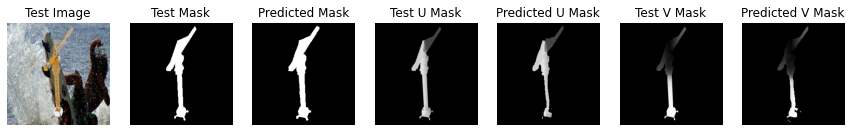

===> Epoch[22/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3135	Loss_V_Mask: 0.2776
===> Epoch[22/100](1000/5000): Loss_Mask: 0.0198	Loss_U_Mask: 0.3785	Loss_V_Mask: 0.3257
===> Epoch[22/100](2000/5000): Loss_Mask: 0.0210	Loss_U_Mask: 0.3269	Loss_V_Mask: 0.2919
===> Epoch[22/100](3000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3036	Loss_V_Mask: 0.2550
===> Epoch[22/100](4000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3595	Loss_V_Mask: 0.3117
===> Epoch[22/100](5000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3727	Loss_V_Mask: 0.3314
Val_Loss_Mask: 0.0279	Val_U_Loss_Mask: 0.3921	Val_V_Loss_Mask: 0.3846


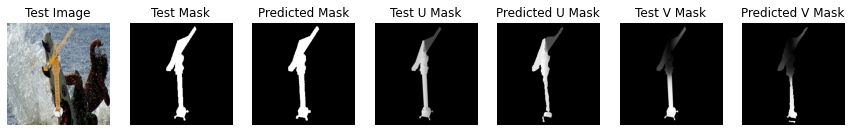

===> Epoch[23/100](0/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3335	Loss_V_Mask: 0.2987
===> Epoch[23/100](1000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3278	Loss_V_Mask: 0.2725
===> Epoch[23/100](2000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.2977	Loss_V_Mask: 0.2696
===> Epoch[23/100](3000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3137	Loss_V_Mask: 0.2563
===> Epoch[23/100](4000/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3634	Loss_V_Mask: 0.3209
===> Epoch[23/100](5000/5000): Loss_Mask: 0.0156	Loss_U_Mask: 0.3508	Loss_V_Mask: 0.2761
Val_Loss_Mask: 0.0303	Val_U_Loss_Mask: 0.3938	Val_V_Loss_Mask: 0.3737


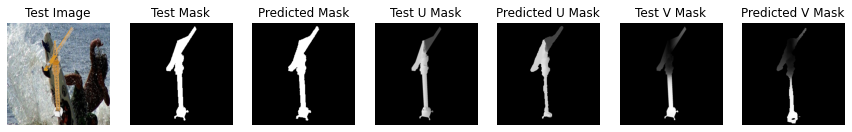

===> Epoch[24/100](0/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3445	Loss_V_Mask: 0.2711
===> Epoch[24/100](1000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3540	Loss_V_Mask: 0.3015
===> Epoch[24/100](2000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.4142	Loss_V_Mask: 0.3905
===> Epoch[24/100](3000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3305	Loss_V_Mask: 0.2767
===> Epoch[24/100](4000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3629	Loss_V_Mask: 0.3012
===> Epoch[24/100](5000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3820	Loss_V_Mask: 0.3152
Val_Loss_Mask: 0.0300	Val_U_Loss_Mask: 0.3932	Val_V_Loss_Mask: 0.3776


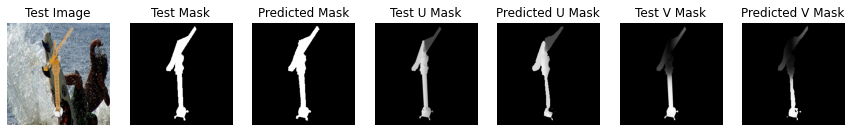

===> Epoch[25/100](0/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3066	Loss_V_Mask: 0.2740
===> Epoch[25/100](1000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3557	Loss_V_Mask: 0.3135
===> Epoch[25/100](2000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3459	Loss_V_Mask: 0.2818
===> Epoch[25/100](3000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3141	Loss_V_Mask: 0.2485
===> Epoch[25/100](4000/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.3089	Loss_V_Mask: 0.2700
===> Epoch[25/100](5000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.2908	Loss_V_Mask: 0.2692
Val_Loss_Mask: 0.0253	Val_U_Loss_Mask: 0.4100	Val_V_Loss_Mask: 0.3881


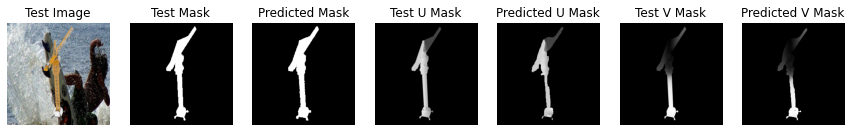

===> Epoch[26/100](0/5000): Loss_Mask: 0.0142	Loss_U_Mask: 0.3310	Loss_V_Mask: 0.2726
===> Epoch[26/100](1000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.2923	Loss_V_Mask: 0.2435
===> Epoch[26/100](2000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.2912	Loss_V_Mask: 0.2579
===> Epoch[26/100](3000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3435	Loss_V_Mask: 0.2940
===> Epoch[26/100](4000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3738	Loss_V_Mask: 0.2938
===> Epoch[26/100](5000/5000): Loss_Mask: 0.0252	Loss_U_Mask: 0.3715	Loss_V_Mask: 0.3304
Val_Loss_Mask: 0.0290	Val_U_Loss_Mask: 0.3876	Val_V_Loss_Mask: 0.3656


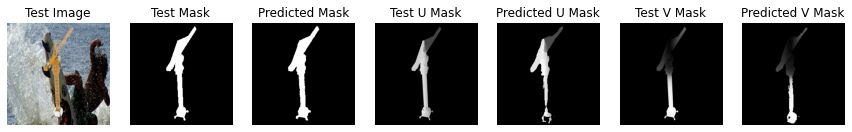

===> Epoch[27/100](0/5000): Loss_Mask: 0.0164	Loss_U_Mask: 0.3604	Loss_V_Mask: 0.3159
===> Epoch[27/100](1000/5000): Loss_Mask: 0.0171	Loss_U_Mask: 0.3393	Loss_V_Mask: 0.3022
===> Epoch[27/100](2000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3110	Loss_V_Mask: 0.2934
===> Epoch[27/100](3000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3232	Loss_V_Mask: 0.2876
===> Epoch[27/100](4000/5000): Loss_Mask: 0.0156	Loss_U_Mask: 0.3392	Loss_V_Mask: 0.2951
===> Epoch[27/100](5000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3685	Loss_V_Mask: 0.3141
Val_Loss_Mask: 0.0250	Val_U_Loss_Mask: 0.3978	Val_V_Loss_Mask: 0.3802


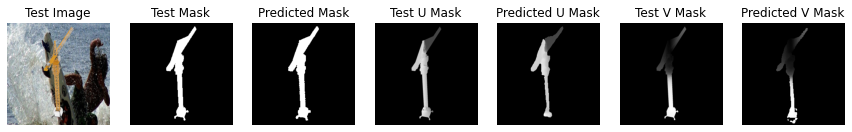

===> Epoch[28/100](0/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3070	Loss_V_Mask: 0.2744
===> Epoch[28/100](1000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3819	Loss_V_Mask: 0.3524
===> Epoch[28/100](2000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3438	Loss_V_Mask: 0.2904
===> Epoch[28/100](3000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.2840	Loss_V_Mask: 0.2430
===> Epoch[28/100](4000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3326	Loss_V_Mask: 0.2905
===> Epoch[28/100](5000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3327	Loss_V_Mask: 0.2835
Val_Loss_Mask: 0.0326	Val_U_Loss_Mask: 0.4292	Val_V_Loss_Mask: 0.4148


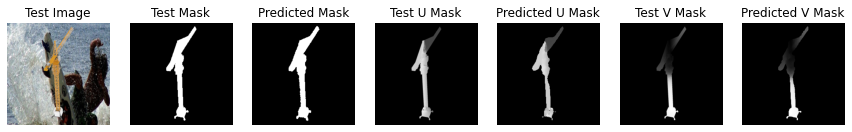

===> Epoch[29/100](0/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.4070	Loss_V_Mask: 0.3475
===> Epoch[29/100](1000/5000): Loss_Mask: 0.0175	Loss_U_Mask: 0.4165	Loss_V_Mask: 0.3798
===> Epoch[29/100](2000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.4024	Loss_V_Mask: 0.3309
===> Epoch[29/100](3000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.4025	Loss_V_Mask: 0.3634
===> Epoch[29/100](4000/5000): Loss_Mask: 0.0254	Loss_U_Mask: 0.3991	Loss_V_Mask: 0.3543
===> Epoch[29/100](5000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3156	Loss_V_Mask: 0.2781
Val_Loss_Mask: 0.0283	Val_U_Loss_Mask: 0.4147	Val_V_Loss_Mask: 0.4016


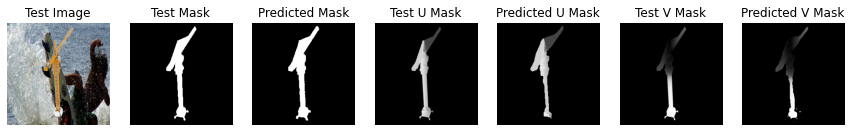

===> Epoch[30/100](0/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3956	Loss_V_Mask: 0.3537
===> Epoch[30/100](1000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3546	Loss_V_Mask: 0.2795
===> Epoch[30/100](2000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3107	Loss_V_Mask: 0.2792
===> Epoch[30/100](3000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3083	Loss_V_Mask: 0.2646
===> Epoch[30/100](4000/5000): Loss_Mask: 0.0195	Loss_U_Mask: 0.4024	Loss_V_Mask: 0.3404
===> Epoch[30/100](5000/5000): Loss_Mask: 0.0184	Loss_U_Mask: 0.3378	Loss_V_Mask: 0.2885
Val_Loss_Mask: 0.0345	Val_U_Loss_Mask: 0.4027	Val_V_Loss_Mask: 0.3999


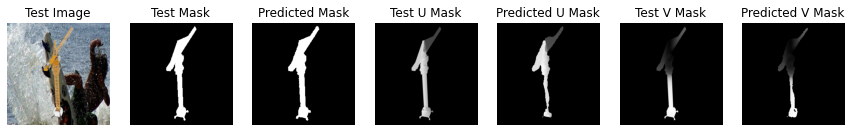

===> Epoch[31/100](0/5000): Loss_Mask: 0.0188	Loss_U_Mask: 0.3613	Loss_V_Mask: 0.3161
===> Epoch[31/100](1000/5000): Loss_Mask: 0.0250	Loss_U_Mask: 0.3988	Loss_V_Mask: 0.3892
===> Epoch[31/100](2000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.2870	Loss_V_Mask: 0.2562
===> Epoch[31/100](3000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3351	Loss_V_Mask: 0.2845
===> Epoch[31/100](4000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3795	Loss_V_Mask: 0.3153
===> Epoch[31/100](5000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.3436	Loss_V_Mask: 0.3109
Val_Loss_Mask: 0.0268	Val_U_Loss_Mask: 0.3874	Val_V_Loss_Mask: 0.3695


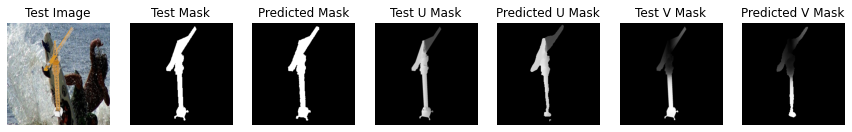

===> Epoch[32/100](0/5000): Loss_Mask: 0.0498	Loss_U_Mask: 0.4723	Loss_V_Mask: 0.4866
===> Epoch[32/100](1000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3281	Loss_V_Mask: 0.2657
===> Epoch[32/100](2000/5000): Loss_Mask: 0.0178	Loss_U_Mask: 0.3543	Loss_V_Mask: 0.3218
===> Epoch[32/100](3000/5000): Loss_Mask: 0.0315	Loss_U_Mask: 0.3635	Loss_V_Mask: 0.3206
===> Epoch[32/100](4000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3543	Loss_V_Mask: 0.3325
===> Epoch[32/100](5000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.3670	Loss_V_Mask: 0.3244
Val_Loss_Mask: 0.0311	Val_U_Loss_Mask: 0.4145	Val_V_Loss_Mask: 0.4040


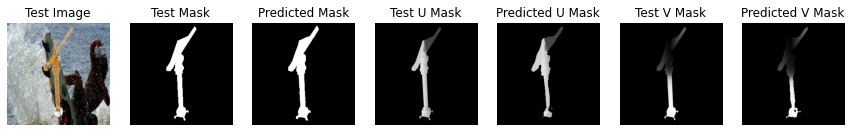

===> Epoch[33/100](0/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3172	Loss_V_Mask: 0.2698
===> Epoch[33/100](1000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3659	Loss_V_Mask: 0.3070
===> Epoch[33/100](2000/5000): Loss_Mask: 0.0282	Loss_U_Mask: 0.3811	Loss_V_Mask: 0.3655
===> Epoch[33/100](3000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3286	Loss_V_Mask: 0.2822
===> Epoch[33/100](4000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3989	Loss_V_Mask: 0.3328
===> Epoch[33/100](5000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3402	Loss_V_Mask: 0.3040
Val_Loss_Mask: 0.0259	Val_U_Loss_Mask: 0.4031	Val_V_Loss_Mask: 0.3904


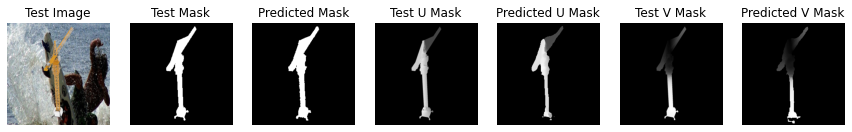

===> Epoch[34/100](0/5000): Loss_Mask: 0.0179	Loss_U_Mask: 0.4116	Loss_V_Mask: 0.3469
===> Epoch[34/100](1000/5000): Loss_Mask: 0.0384	Loss_U_Mask: 0.4729	Loss_V_Mask: 0.4309
===> Epoch[34/100](2000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3289	Loss_V_Mask: 0.2738
===> Epoch[34/100](3000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3363	Loss_V_Mask: 0.2904
===> Epoch[34/100](4000/5000): Loss_Mask: 0.0222	Loss_U_Mask: 0.3694	Loss_V_Mask: 0.3061
===> Epoch[34/100](5000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3689	Loss_V_Mask: 0.3364
Val_Loss_Mask: 0.0304	Val_U_Loss_Mask: 0.3948	Val_V_Loss_Mask: 0.3803


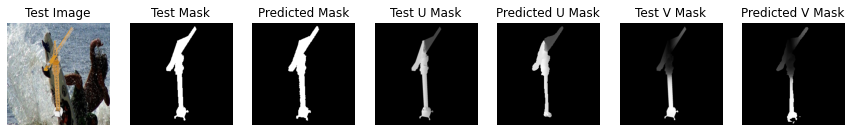

===> Epoch[35/100](0/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.3871	Loss_V_Mask: 0.3340
===> Epoch[35/100](1000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3374	Loss_V_Mask: 0.2955
===> Epoch[35/100](2000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3928	Loss_V_Mask: 0.3791
===> Epoch[35/100](3000/5000): Loss_Mask: 0.0135	Loss_U_Mask: 0.2939	Loss_V_Mask: 0.2545
===> Epoch[35/100](4000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.4200	Loss_V_Mask: 0.3644
===> Epoch[35/100](5000/5000): Loss_Mask: 0.0094	Loss_U_Mask: 0.2974	Loss_V_Mask: 0.2585
Val_Loss_Mask: 0.0272	Val_U_Loss_Mask: 0.4100	Val_V_Loss_Mask: 0.4049


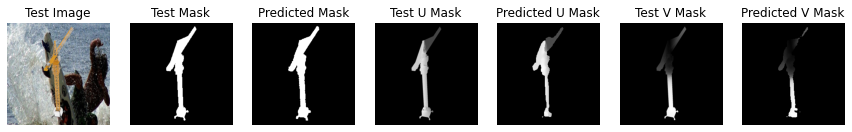

===> Epoch[36/100](0/5000): Loss_Mask: 0.0314	Loss_U_Mask: 0.3912	Loss_V_Mask: 0.3560
===> Epoch[36/100](1000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.4239	Loss_V_Mask: 0.3950
===> Epoch[36/100](2000/5000): Loss_Mask: 0.0151	Loss_U_Mask: 0.3676	Loss_V_Mask: 0.3182
===> Epoch[36/100](3000/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3532	Loss_V_Mask: 0.3006
===> Epoch[36/100](4000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.3881	Loss_V_Mask: 0.3368
===> Epoch[36/100](5000/5000): Loss_Mask: 0.0212	Loss_U_Mask: 0.4037	Loss_V_Mask: 0.3621
Val_Loss_Mask: 0.0304	Val_U_Loss_Mask: 0.3915	Val_V_Loss_Mask: 0.3651


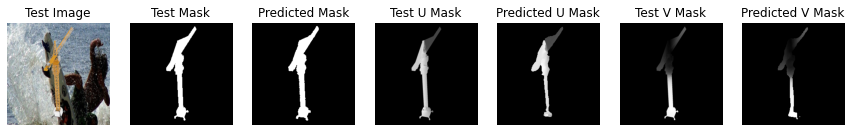

===> Epoch[37/100](0/5000): Loss_Mask: 0.0230	Loss_U_Mask: 0.3919	Loss_V_Mask: 0.3585
===> Epoch[37/100](1000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3216	Loss_V_Mask: 0.2802
===> Epoch[37/100](2000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.4364	Loss_V_Mask: 0.3492
===> Epoch[37/100](3000/5000): Loss_Mask: 0.0175	Loss_U_Mask: 0.3980	Loss_V_Mask: 0.3584
===> Epoch[37/100](4000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3390	Loss_V_Mask: 0.3128
===> Epoch[37/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.2798	Loss_V_Mask: 0.2601
Val_Loss_Mask: 0.0273	Val_U_Loss_Mask: 0.4015	Val_V_Loss_Mask: 0.3953


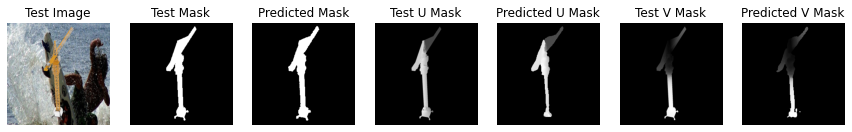

===> Epoch[38/100](0/5000): Loss_Mask: 0.0168	Loss_U_Mask: 0.3751	Loss_V_Mask: 0.3249
===> Epoch[38/100](1000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.2987	Loss_V_Mask: 0.2618
===> Epoch[38/100](2000/5000): Loss_Mask: 0.0160	Loss_U_Mask: 0.4543	Loss_V_Mask: 0.3862
===> Epoch[38/100](3000/5000): Loss_Mask: 0.0170	Loss_U_Mask: 0.3221	Loss_V_Mask: 0.2932
===> Epoch[38/100](4000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3753	Loss_V_Mask: 0.3102
===> Epoch[38/100](5000/5000): Loss_Mask: 0.0185	Loss_U_Mask: 0.3796	Loss_V_Mask: 0.3313
Val_Loss_Mask: 0.0297	Val_U_Loss_Mask: 0.4039	Val_V_Loss_Mask: 0.3874


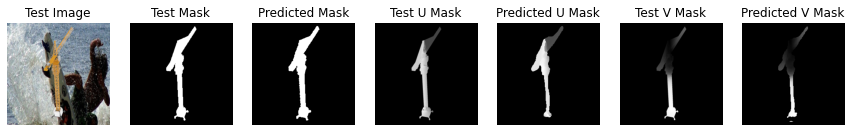

===> Epoch[39/100](0/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3636	Loss_V_Mask: 0.2888
===> Epoch[39/100](1000/5000): Loss_Mask: 0.0233	Loss_U_Mask: 0.3429	Loss_V_Mask: 0.3174
===> Epoch[39/100](2000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.4232	Loss_V_Mask: 0.3971
===> Epoch[39/100](3000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3304	Loss_V_Mask: 0.2829
===> Epoch[39/100](4000/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3137	Loss_V_Mask: 0.2737
===> Epoch[39/100](5000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3529	Loss_V_Mask: 0.2888
Val_Loss_Mask: 0.0245	Val_U_Loss_Mask: 0.4006	Val_V_Loss_Mask: 0.3856


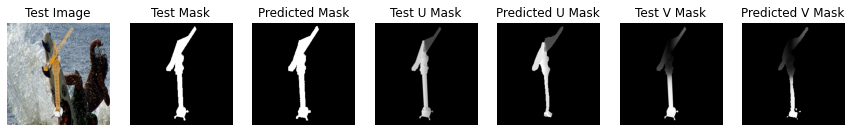

===> Epoch[40/100](0/5000): Loss_Mask: 0.0608	Loss_U_Mask: 0.4238	Loss_V_Mask: 0.3621
===> Epoch[40/100](1000/5000): Loss_Mask: 0.0179	Loss_U_Mask: 0.3468	Loss_V_Mask: 0.2992
===> Epoch[40/100](2000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3324	Loss_V_Mask: 0.2888
===> Epoch[40/100](3000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3910	Loss_V_Mask: 0.3482
===> Epoch[40/100](4000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3480	Loss_V_Mask: 0.2836
===> Epoch[40/100](5000/5000): Loss_Mask: 0.0214	Loss_U_Mask: 0.4234	Loss_V_Mask: 0.3537
Val_Loss_Mask: 0.0265	Val_U_Loss_Mask: 0.3783	Val_V_Loss_Mask: 0.3611


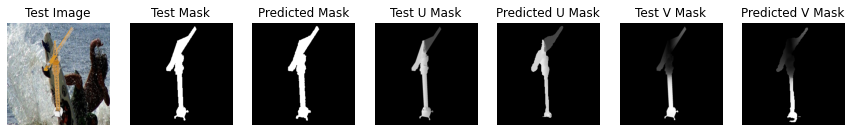

===> Epoch[41/100](0/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3480	Loss_V_Mask: 0.2738
===> Epoch[41/100](1000/5000): Loss_Mask: 0.0086	Loss_U_Mask: 0.3227	Loss_V_Mask: 0.2843
===> Epoch[41/100](2000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.2957	Loss_V_Mask: 0.2634
===> Epoch[41/100](3000/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.3646	Loss_V_Mask: 0.3206
===> Epoch[41/100](4000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3922	Loss_V_Mask: 0.3251
===> Epoch[41/100](5000/5000): Loss_Mask: 0.0160	Loss_U_Mask: 0.3473	Loss_V_Mask: 0.3229
Val_Loss_Mask: 0.0255	Val_U_Loss_Mask: 0.3865	Val_V_Loss_Mask: 0.3766


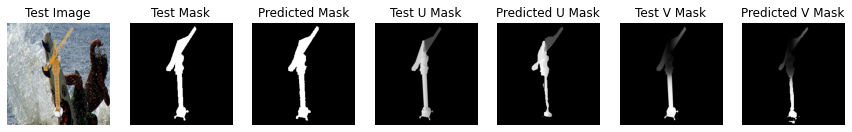

===> Epoch[42/100](0/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3633	Loss_V_Mask: 0.3046
===> Epoch[42/100](1000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3776	Loss_V_Mask: 0.3120
===> Epoch[42/100](2000/5000): Loss_Mask: 0.0226	Loss_U_Mask: 0.5934	Loss_V_Mask: 0.5497
===> Epoch[42/100](3000/5000): Loss_Mask: 0.0183	Loss_U_Mask: 0.4034	Loss_V_Mask: 0.3473
===> Epoch[42/100](4000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.4051	Loss_V_Mask: 0.4073
===> Epoch[42/100](5000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3636	Loss_V_Mask: 0.3210
Val_Loss_Mask: 0.0348	Val_U_Loss_Mask: 0.4009	Val_V_Loss_Mask: 0.3932


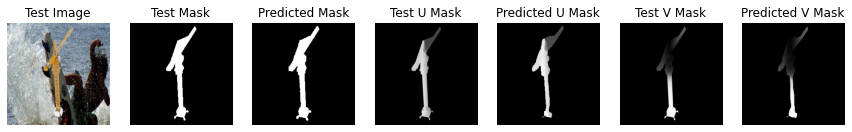

===> Epoch[43/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.4498	Loss_V_Mask: 0.3887
===> Epoch[43/100](1000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3487	Loss_V_Mask: 0.3220
===> Epoch[43/100](2000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3840	Loss_V_Mask: 0.3194
===> Epoch[43/100](3000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3870	Loss_V_Mask: 0.3280
===> Epoch[43/100](4000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.4020	Loss_V_Mask: 0.3245
===> Epoch[43/100](5000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3377	Loss_V_Mask: 0.2852
Val_Loss_Mask: 0.0260	Val_U_Loss_Mask: 0.3889	Val_V_Loss_Mask: 0.3666


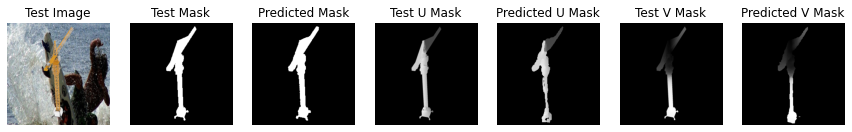

===> Epoch[44/100](0/5000): Loss_Mask: 0.0641	Loss_U_Mask: 0.4531	Loss_V_Mask: 0.4415
===> Epoch[44/100](1000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3423	Loss_V_Mask: 0.2742
===> Epoch[44/100](2000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3836	Loss_V_Mask: 0.3356
===> Epoch[44/100](3000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3511	Loss_V_Mask: 0.3153
===> Epoch[44/100](4000/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.3718	Loss_V_Mask: 0.3273
===> Epoch[44/100](5000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3114	Loss_V_Mask: 0.2781
Val_Loss_Mask: 0.0303	Val_U_Loss_Mask: 0.4027	Val_V_Loss_Mask: 0.3955


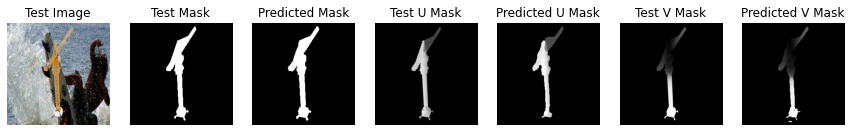

===> Epoch[45/100](0/5000): Loss_Mask: 0.0305	Loss_U_Mask: 0.3975	Loss_V_Mask: 0.3254
===> Epoch[45/100](1000/5000): Loss_Mask: 0.0168	Loss_U_Mask: 0.3285	Loss_V_Mask: 0.2892
===> Epoch[45/100](2000/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3138	Loss_V_Mask: 0.2677
===> Epoch[45/100](3000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3534	Loss_V_Mask: 0.3241
===> Epoch[45/100](4000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3351	Loss_V_Mask: 0.2916
===> Epoch[45/100](5000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3272	Loss_V_Mask: 0.2618
Val_Loss_Mask: 0.0257	Val_U_Loss_Mask: 0.3964	Val_V_Loss_Mask: 0.3782


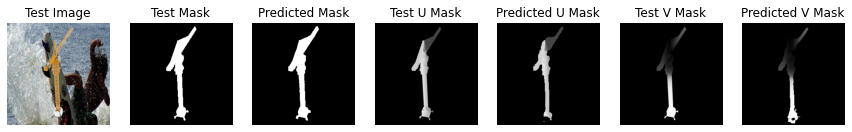

===> Epoch[46/100](0/5000): Loss_Mask: 0.0179	Loss_U_Mask: 0.3872	Loss_V_Mask: 0.3189
===> Epoch[46/100](1000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3695	Loss_V_Mask: 0.3087
===> Epoch[46/100](2000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3393	Loss_V_Mask: 0.2667
===> Epoch[46/100](3000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3696	Loss_V_Mask: 0.2886
===> Epoch[46/100](4000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3921	Loss_V_Mask: 0.3172
===> Epoch[46/100](5000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3633	Loss_V_Mask: 0.3139
Val_Loss_Mask: 0.0281	Val_U_Loss_Mask: 0.3966	Val_V_Loss_Mask: 0.3868


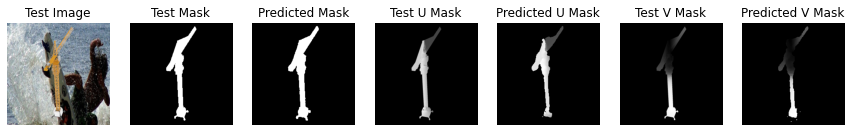

===> Epoch[47/100](0/5000): Loss_Mask: 0.0160	Loss_U_Mask: 0.3499	Loss_V_Mask: 0.3013
===> Epoch[47/100](1000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3726	Loss_V_Mask: 0.3078
===> Epoch[47/100](2000/5000): Loss_Mask: 0.0209	Loss_U_Mask: 0.3675	Loss_V_Mask: 0.3320
===> Epoch[47/100](3000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3464	Loss_V_Mask: 0.2948
===> Epoch[47/100](4000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3684	Loss_V_Mask: 0.3325
===> Epoch[47/100](5000/5000): Loss_Mask: 0.0247	Loss_U_Mask: 0.4409	Loss_V_Mask: 0.3920
Val_Loss_Mask: 0.0262	Val_U_Loss_Mask: 0.3873	Val_V_Loss_Mask: 0.3670


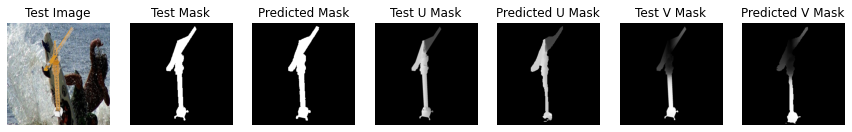

===> Epoch[48/100](0/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.3847	Loss_V_Mask: 0.3235
===> Epoch[48/100](1000/5000): Loss_Mask: 0.0230	Loss_U_Mask: 0.3745	Loss_V_Mask: 0.3279
===> Epoch[48/100](2000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3307	Loss_V_Mask: 0.2640
===> Epoch[48/100](3000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3917	Loss_V_Mask: 0.3418
===> Epoch[48/100](4000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3164	Loss_V_Mask: 0.2646
===> Epoch[48/100](5000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3026	Loss_V_Mask: 0.2626
Val_Loss_Mask: 0.0316	Val_U_Loss_Mask: 0.3941	Val_V_Loss_Mask: 0.3787


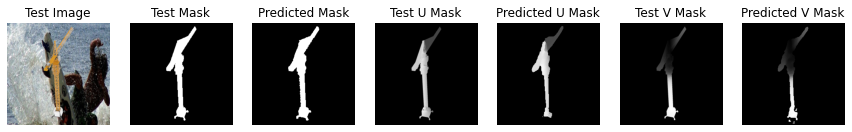

===> Epoch[49/100](0/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.3314	Loss_V_Mask: 0.2551
===> Epoch[49/100](1000/5000): Loss_Mask: 0.0227	Loss_U_Mask: 0.3856	Loss_V_Mask: 0.3032
===> Epoch[49/100](2000/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3170	Loss_V_Mask: 0.2930
===> Epoch[49/100](3000/5000): Loss_Mask: 0.0219	Loss_U_Mask: 0.5195	Loss_V_Mask: 0.5331
===> Epoch[49/100](4000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3715	Loss_V_Mask: 0.3089
===> Epoch[49/100](5000/5000): Loss_Mask: 0.0213	Loss_U_Mask: 0.3654	Loss_V_Mask: 0.3332
Val_Loss_Mask: 0.0251	Val_U_Loss_Mask: 0.3895	Val_V_Loss_Mask: 0.3761


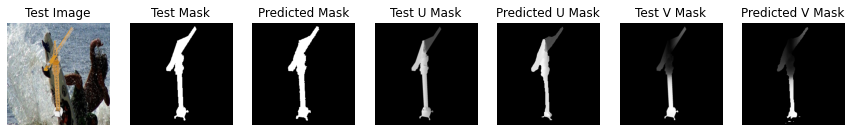

===> Epoch[50/100](0/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3504	Loss_V_Mask: 0.2791
===> Epoch[50/100](1000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3338	Loss_V_Mask: 0.2855
===> Epoch[50/100](2000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3644	Loss_V_Mask: 0.3152
===> Epoch[50/100](3000/5000): Loss_Mask: 0.0245	Loss_U_Mask: 0.3692	Loss_V_Mask: 0.3284
===> Epoch[50/100](4000/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3450	Loss_V_Mask: 0.2830
===> Epoch[50/100](5000/5000): Loss_Mask: 0.0207	Loss_U_Mask: 0.3759	Loss_V_Mask: 0.3313
Val_Loss_Mask: 0.0298	Val_U_Loss_Mask: 0.3915	Val_V_Loss_Mask: 0.3728


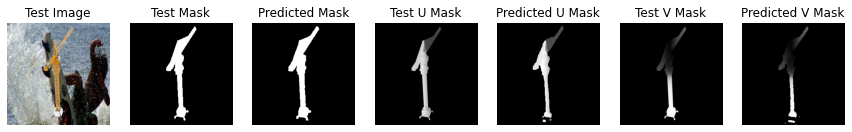

===> Epoch[51/100](0/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3603	Loss_V_Mask: 0.2984
===> Epoch[51/100](1000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3331	Loss_V_Mask: 0.2768
===> Epoch[51/100](2000/5000): Loss_Mask: 0.0196	Loss_U_Mask: 0.4029	Loss_V_Mask: 0.3363
===> Epoch[51/100](3000/5000): Loss_Mask: 0.0209	Loss_U_Mask: 0.3810	Loss_V_Mask: 0.3286
===> Epoch[51/100](4000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.3223	Loss_V_Mask: 0.2668
===> Epoch[51/100](5000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3214	Loss_V_Mask: 0.2875
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.4010	Val_V_Loss_Mask: 0.3792


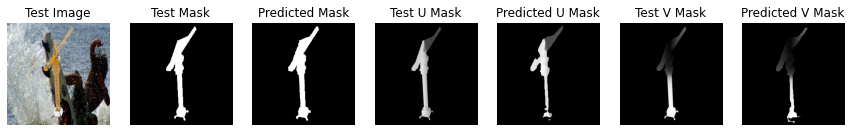

===> Epoch[52/100](0/5000): Loss_Mask: 0.0187	Loss_U_Mask: 0.4552	Loss_V_Mask: 0.4544
===> Epoch[52/100](1000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3693	Loss_V_Mask: 0.3065
===> Epoch[52/100](2000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3642	Loss_V_Mask: 0.2875
===> Epoch[52/100](3000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.2936	Loss_V_Mask: 0.2461
===> Epoch[52/100](4000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3341	Loss_V_Mask: 0.2894
===> Epoch[52/100](5000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3027	Loss_V_Mask: 0.2691
Val_Loss_Mask: 0.0241	Val_U_Loss_Mask: 0.3996	Val_V_Loss_Mask: 0.3941


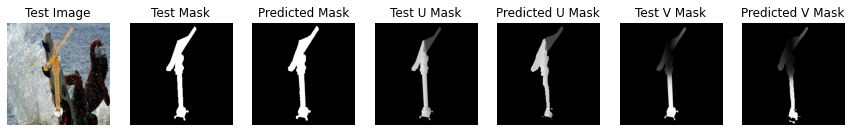

===> Epoch[53/100](0/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.4272	Loss_V_Mask: 0.4221
===> Epoch[53/100](1000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3441	Loss_V_Mask: 0.2961
===> Epoch[53/100](2000/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.2655	Loss_V_Mask: 0.2355
===> Epoch[53/100](3000/5000): Loss_Mask: 0.0097	Loss_U_Mask: 0.2934	Loss_V_Mask: 0.2556
===> Epoch[53/100](4000/5000): Loss_Mask: 0.0197	Loss_U_Mask: 0.3672	Loss_V_Mask: 0.3283
===> Epoch[53/100](5000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.2919	Loss_V_Mask: 0.2572
Val_Loss_Mask: 0.0243	Val_U_Loss_Mask: 0.4216	Val_V_Loss_Mask: 0.3992


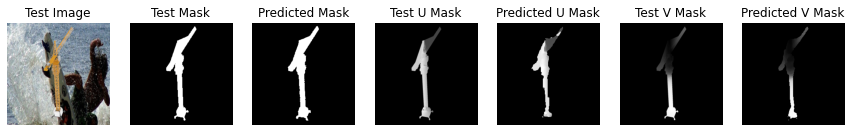

===> Epoch[54/100](0/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3501	Loss_V_Mask: 0.3034
===> Epoch[54/100](1000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.3402	Loss_V_Mask: 0.2917
===> Epoch[54/100](2000/5000): Loss_Mask: 0.0168	Loss_U_Mask: 0.2951	Loss_V_Mask: 0.2597
===> Epoch[54/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3588	Loss_V_Mask: 0.3126
===> Epoch[54/100](4000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3690	Loss_V_Mask: 0.3323
===> Epoch[54/100](5000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3853	Loss_V_Mask: 0.3194
Val_Loss_Mask: 0.0249	Val_U_Loss_Mask: 0.3985	Val_V_Loss_Mask: 0.3842


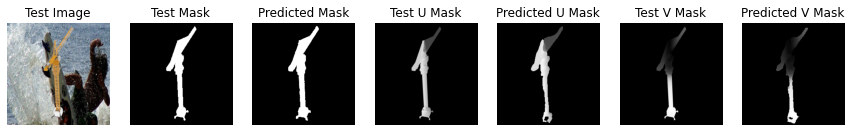

===> Epoch[55/100](0/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3280	Loss_V_Mask: 0.2778
===> Epoch[55/100](1000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.4131	Loss_V_Mask: 0.3936
===> Epoch[55/100](2000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3343	Loss_V_Mask: 0.2681
===> Epoch[55/100](3000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3513	Loss_V_Mask: 0.2978
===> Epoch[55/100](4000/5000): Loss_Mask: 0.0135	Loss_U_Mask: 0.4034	Loss_V_Mask: 0.3270
===> Epoch[55/100](5000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3603	Loss_V_Mask: 0.3107
Val_Loss_Mask: 0.0266	Val_U_Loss_Mask: 0.4108	Val_V_Loss_Mask: 0.3985


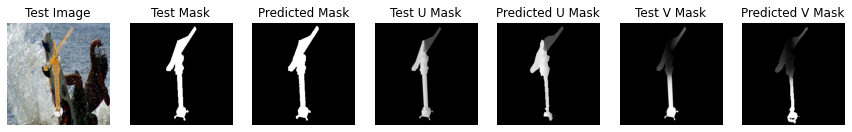

===> Epoch[56/100](0/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.5117	Loss_V_Mask: 0.5379
===> Epoch[56/100](1000/5000): Loss_Mask: 0.0200	Loss_U_Mask: 0.3043	Loss_V_Mask: 0.2880
===> Epoch[56/100](2000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3637	Loss_V_Mask: 0.3161
===> Epoch[56/100](3000/5000): Loss_Mask: 0.0152	Loss_U_Mask: 0.3238	Loss_V_Mask: 0.2683
===> Epoch[56/100](4000/5000): Loss_Mask: 0.0208	Loss_U_Mask: 0.4089	Loss_V_Mask: 0.3767
===> Epoch[56/100](5000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.3242	Loss_V_Mask: 0.2858
Val_Loss_Mask: 0.0271	Val_U_Loss_Mask: 0.3867	Val_V_Loss_Mask: 0.3685


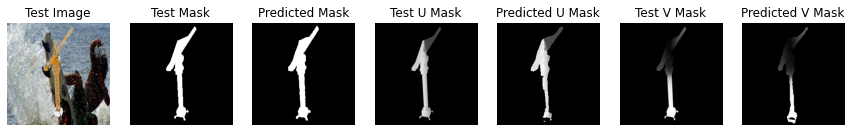

===> Epoch[57/100](0/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3401	Loss_V_Mask: 0.2772
===> Epoch[57/100](1000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3386	Loss_V_Mask: 0.2843
===> Epoch[57/100](2000/5000): Loss_Mask: 0.0137	Loss_U_Mask: 0.3504	Loss_V_Mask: 0.2885
===> Epoch[57/100](3000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3670	Loss_V_Mask: 0.2875
===> Epoch[57/100](4000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3692	Loss_V_Mask: 0.3117
===> Epoch[57/100](5000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3185	Loss_V_Mask: 0.2722
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.4100	Val_V_Loss_Mask: 0.4129


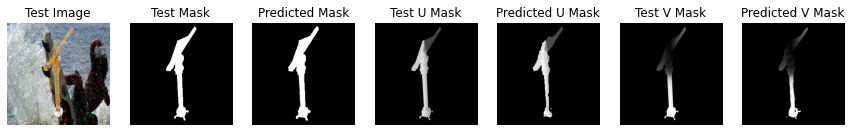

===> Epoch[58/100](0/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3454	Loss_V_Mask: 0.3032
===> Epoch[58/100](1000/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.4401	Loss_V_Mask: 0.3898
===> Epoch[58/100](2000/5000): Loss_Mask: 0.0153	Loss_U_Mask: 0.3297	Loss_V_Mask: 0.2962
===> Epoch[58/100](3000/5000): Loss_Mask: 0.0225	Loss_U_Mask: 0.4091	Loss_V_Mask: 0.3521
===> Epoch[58/100](4000/5000): Loss_Mask: 0.0204	Loss_U_Mask: 0.4463	Loss_V_Mask: 0.3924
===> Epoch[58/100](5000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3798	Loss_V_Mask: 0.3309
Val_Loss_Mask: 0.0249	Val_U_Loss_Mask: 0.3980	Val_V_Loss_Mask: 0.3804


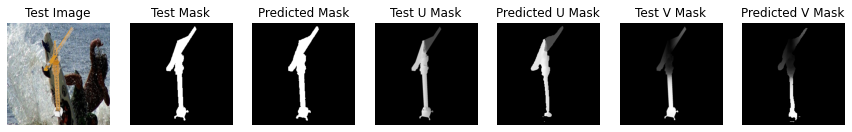

===> Epoch[59/100](0/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.2781	Loss_V_Mask: 0.2337
===> Epoch[59/100](1000/5000): Loss_Mask: 0.0168	Loss_U_Mask: 0.3837	Loss_V_Mask: 0.3370
===> Epoch[59/100](2000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.4323	Loss_V_Mask: 0.3814
===> Epoch[59/100](3000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3240	Loss_V_Mask: 0.2658
===> Epoch[59/100](4000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3749	Loss_V_Mask: 0.3158
===> Epoch[59/100](5000/5000): Loss_Mask: 0.0281	Loss_U_Mask: 0.3917	Loss_V_Mask: 0.3532
Val_Loss_Mask: 0.0373	Val_U_Loss_Mask: 0.4020	Val_V_Loss_Mask: 0.3960


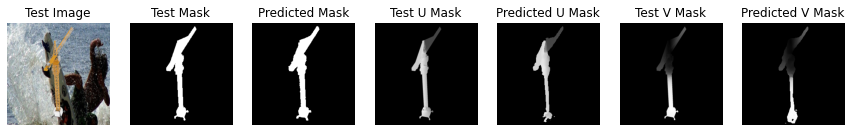

===> Epoch[60/100](0/5000): Loss_Mask: 0.0313	Loss_U_Mask: 0.4883	Loss_V_Mask: 0.5058
===> Epoch[60/100](1000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.3731	Loss_V_Mask: 0.3273
===> Epoch[60/100](2000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3738	Loss_V_Mask: 0.3163
===> Epoch[60/100](3000/5000): Loss_Mask: 0.0227	Loss_U_Mask: 0.4321	Loss_V_Mask: 0.4054
===> Epoch[60/100](4000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3352	Loss_V_Mask: 0.2865
===> Epoch[60/100](5000/5000): Loss_Mask: 0.0178	Loss_U_Mask: 0.3269	Loss_V_Mask: 0.2915
Val_Loss_Mask: 0.0278	Val_U_Loss_Mask: 0.3952	Val_V_Loss_Mask: 0.3840


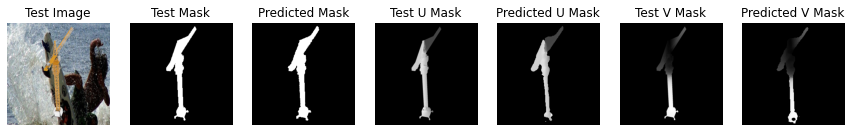

===> Epoch[61/100](0/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.4097	Loss_V_Mask: 0.3340
===> Epoch[61/100](1000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3660	Loss_V_Mask: 0.3139
===> Epoch[61/100](2000/5000): Loss_Mask: 0.0178	Loss_U_Mask: 0.2893	Loss_V_Mask: 0.2657
===> Epoch[61/100](3000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3969	Loss_V_Mask: 0.3416
===> Epoch[61/100](4000/5000): Loss_Mask: 0.0184	Loss_U_Mask: 0.3406	Loss_V_Mask: 0.2988
===> Epoch[61/100](5000/5000): Loss_Mask: 0.0118	Loss_U_Mask: 0.3402	Loss_V_Mask: 0.2818
Val_Loss_Mask: 0.0292	Val_U_Loss_Mask: 0.4188	Val_V_Loss_Mask: 0.4135


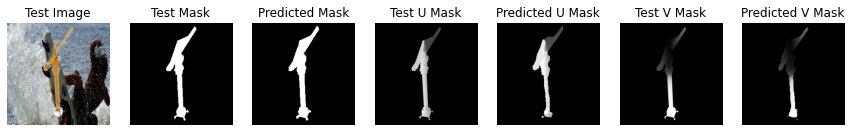

===> Epoch[62/100](0/5000): Loss_Mask: 0.0204	Loss_U_Mask: 0.3527	Loss_V_Mask: 0.3119
===> Epoch[62/100](1000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3176	Loss_V_Mask: 0.2757
===> Epoch[62/100](2000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.4444	Loss_V_Mask: 0.4377
===> Epoch[62/100](3000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3516	Loss_V_Mask: 0.2933
===> Epoch[62/100](4000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.4055	Loss_V_Mask: 0.3832
===> Epoch[62/100](5000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.4065	Loss_V_Mask: 0.3625
Val_Loss_Mask: 0.0272	Val_U_Loss_Mask: 0.3982	Val_V_Loss_Mask: 0.3752


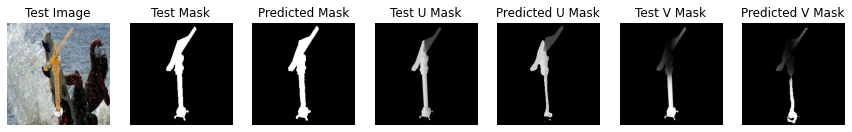

===> Epoch[63/100](0/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3500	Loss_V_Mask: 0.2974
===> Epoch[63/100](1000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3257	Loss_V_Mask: 0.2805
===> Epoch[63/100](2000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3164	Loss_V_Mask: 0.2870
===> Epoch[63/100](3000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3383	Loss_V_Mask: 0.2931
===> Epoch[63/100](4000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.4260	Loss_V_Mask: 0.3533
===> Epoch[63/100](5000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3495	Loss_V_Mask: 0.2963
Val_Loss_Mask: 0.0272	Val_U_Loss_Mask: 0.4044	Val_V_Loss_Mask: 0.3792


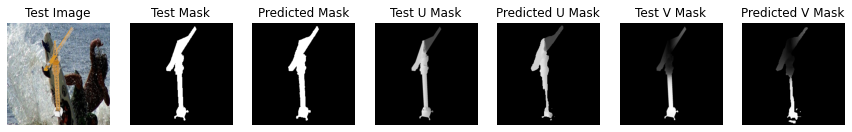

===> Epoch[64/100](0/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3381	Loss_V_Mask: 0.2862
===> Epoch[64/100](1000/5000): Loss_Mask: 0.0248	Loss_U_Mask: 0.3819	Loss_V_Mask: 0.3614
===> Epoch[64/100](2000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3581	Loss_V_Mask: 0.3175
===> Epoch[64/100](3000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3675	Loss_V_Mask: 0.3107
===> Epoch[64/100](4000/5000): Loss_Mask: 0.0363	Loss_U_Mask: 0.5438	Loss_V_Mask: 0.5210
===> Epoch[64/100](5000/5000): Loss_Mask: 0.0152	Loss_U_Mask: 0.3792	Loss_V_Mask: 0.3446
Val_Loss_Mask: 0.0274	Val_U_Loss_Mask: 0.4066	Val_V_Loss_Mask: 0.3871


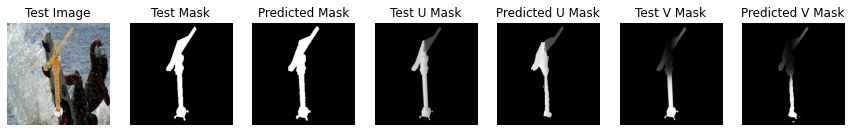

===> Epoch[65/100](0/5000): Loss_Mask: 0.0311	Loss_U_Mask: 0.3498	Loss_V_Mask: 0.3219
===> Epoch[65/100](1000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3832	Loss_V_Mask: 0.3165
===> Epoch[65/100](2000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3778	Loss_V_Mask: 0.3366
===> Epoch[65/100](3000/5000): Loss_Mask: 0.0142	Loss_U_Mask: 0.3374	Loss_V_Mask: 0.2982
===> Epoch[65/100](4000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3719	Loss_V_Mask: 0.3240
===> Epoch[65/100](5000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3215	Loss_V_Mask: 0.2968
Val_Loss_Mask: 0.0307	Val_U_Loss_Mask: 0.4137	Val_V_Loss_Mask: 0.4061


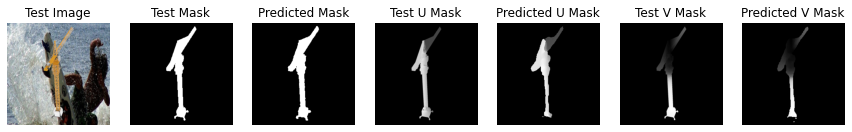

===> Epoch[66/100](0/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.4031	Loss_V_Mask: 0.3389
===> Epoch[66/100](1000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3745	Loss_V_Mask: 0.3247
===> Epoch[66/100](2000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3990	Loss_V_Mask: 0.3675
===> Epoch[66/100](3000/5000): Loss_Mask: 0.0158	Loss_U_Mask: 0.5067	Loss_V_Mask: 0.4566
===> Epoch[66/100](4000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.4069	Loss_V_Mask: 0.3462
===> Epoch[66/100](5000/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.3422	Loss_V_Mask: 0.2699
Val_Loss_Mask: 0.0241	Val_U_Loss_Mask: 0.4018	Val_V_Loss_Mask: 0.3823


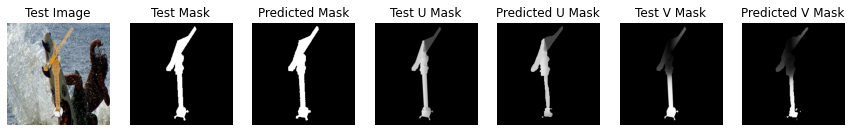

===> Epoch[67/100](0/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3690	Loss_V_Mask: 0.3368
===> Epoch[67/100](1000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.4354	Loss_V_Mask: 0.4074
===> Epoch[67/100](2000/5000): Loss_Mask: 0.0082	Loss_U_Mask: 0.2887	Loss_V_Mask: 0.2620
===> Epoch[67/100](3000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3760	Loss_V_Mask: 0.3046
===> Epoch[67/100](4000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3349	Loss_V_Mask: 0.3051
===> Epoch[67/100](5000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3983	Loss_V_Mask: 0.3627
Val_Loss_Mask: 0.0265	Val_U_Loss_Mask: 0.4008	Val_V_Loss_Mask: 0.3909


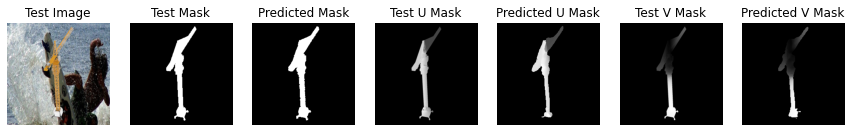

===> Epoch[68/100](0/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3397	Loss_V_Mask: 0.2837
===> Epoch[68/100](1000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.3171	Loss_V_Mask: 0.2607
===> Epoch[68/100](2000/5000): Loss_Mask: 0.0142	Loss_U_Mask: 0.4160	Loss_V_Mask: 0.3784
===> Epoch[68/100](3000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3635	Loss_V_Mask: 0.3442
===> Epoch[68/100](4000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3446	Loss_V_Mask: 0.2981
===> Epoch[68/100](5000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3376	Loss_V_Mask: 0.2806
Val_Loss_Mask: 0.0309	Val_U_Loss_Mask: 0.4002	Val_V_Loss_Mask: 0.3823


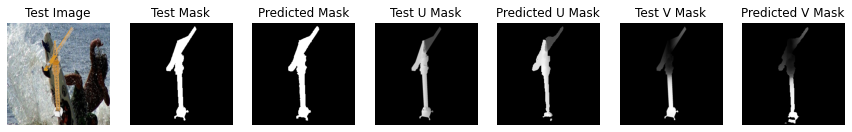

===> Epoch[69/100](0/5000): Loss_Mask: 0.0142	Loss_U_Mask: 0.3543	Loss_V_Mask: 0.2941
===> Epoch[69/100](1000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3306	Loss_V_Mask: 0.2762
===> Epoch[69/100](2000/5000): Loss_Mask: 0.0096	Loss_U_Mask: 0.5204	Loss_V_Mask: 0.4092
===> Epoch[69/100](3000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3389	Loss_V_Mask: 0.3007
===> Epoch[69/100](4000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3138	Loss_V_Mask: 0.2611
===> Epoch[69/100](5000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3507	Loss_V_Mask: 0.2866
Val_Loss_Mask: 0.0276	Val_U_Loss_Mask: 0.4102	Val_V_Loss_Mask: 0.3869


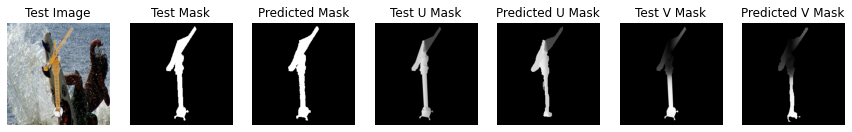

===> Epoch[70/100](0/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3881	Loss_V_Mask: 0.3409
===> Epoch[70/100](1000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.3447	Loss_V_Mask: 0.3060
===> Epoch[70/100](2000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3911	Loss_V_Mask: 0.3618
===> Epoch[70/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3321	Loss_V_Mask: 0.2667
===> Epoch[70/100](4000/5000): Loss_Mask: 0.0225	Loss_U_Mask: 0.3554	Loss_V_Mask: 0.3498
===> Epoch[70/100](5000/5000): Loss_Mask: 0.0215	Loss_U_Mask: 0.3950	Loss_V_Mask: 0.3524
Val_Loss_Mask: 0.0281	Val_U_Loss_Mask: 0.4047	Val_V_Loss_Mask: 0.3802


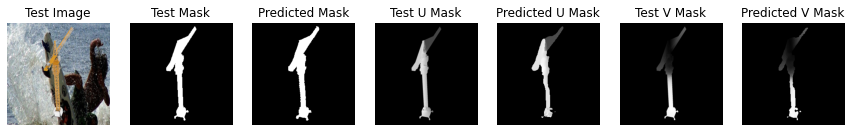

===> Epoch[71/100](0/5000): Loss_Mask: 0.0170	Loss_U_Mask: 0.4340	Loss_V_Mask: 0.3916
===> Epoch[71/100](1000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3146	Loss_V_Mask: 0.2683
===> Epoch[71/100](2000/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3485	Loss_V_Mask: 0.3121
===> Epoch[71/100](3000/5000): Loss_Mask: 0.0170	Loss_U_Mask: 0.3387	Loss_V_Mask: 0.2893
===> Epoch[71/100](4000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3182	Loss_V_Mask: 0.2887
===> Epoch[71/100](5000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.3456	Loss_V_Mask: 0.2679
Val_Loss_Mask: 0.0279	Val_U_Loss_Mask: 0.4266	Val_V_Loss_Mask: 0.4110


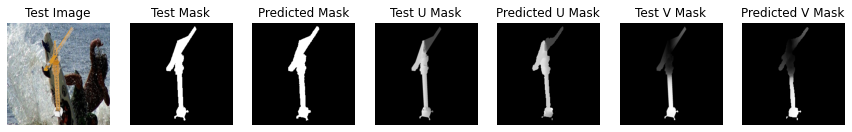

===> Epoch[72/100](0/5000): Loss_Mask: 0.0184	Loss_U_Mask: 0.3618	Loss_V_Mask: 0.3243
===> Epoch[72/100](1000/5000): Loss_Mask: 0.0233	Loss_U_Mask: 0.3550	Loss_V_Mask: 0.3058
===> Epoch[72/100](2000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3578	Loss_V_Mask: 0.3165
===> Epoch[72/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.2854	Loss_V_Mask: 0.2595
===> Epoch[72/100](4000/5000): Loss_Mask: 0.0135	Loss_U_Mask: 0.3227	Loss_V_Mask: 0.2920
===> Epoch[72/100](5000/5000): Loss_Mask: 0.0194	Loss_U_Mask: 0.3637	Loss_V_Mask: 0.3148
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.4087	Val_V_Loss_Mask: 0.3877


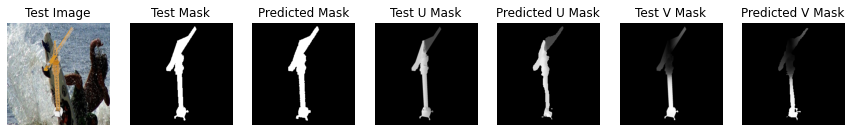

===> Epoch[73/100](0/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.4238	Loss_V_Mask: 0.3728
===> Epoch[73/100](1000/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.3497	Loss_V_Mask: 0.3180
===> Epoch[73/100](2000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3641	Loss_V_Mask: 0.3221
===> Epoch[73/100](3000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3333	Loss_V_Mask: 0.3044
===> Epoch[73/100](4000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.3518	Loss_V_Mask: 0.3005
===> Epoch[73/100](5000/5000): Loss_Mask: 0.0164	Loss_U_Mask: 0.3958	Loss_V_Mask: 0.3342
Val_Loss_Mask: 0.0299	Val_U_Loss_Mask: 0.4111	Val_V_Loss_Mask: 0.3949


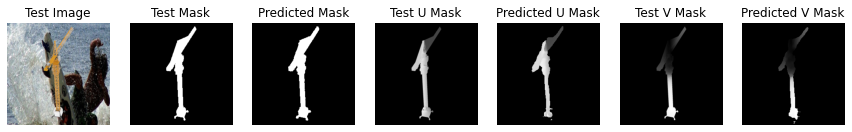

===> Epoch[74/100](0/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3755	Loss_V_Mask: 0.3130
===> Epoch[74/100](1000/5000): Loss_Mask: 0.0117	Loss_U_Mask: 0.3581	Loss_V_Mask: 0.3123
===> Epoch[74/100](2000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.3657	Loss_V_Mask: 0.3162
===> Epoch[74/100](3000/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3175	Loss_V_Mask: 0.2812
===> Epoch[74/100](4000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3239	Loss_V_Mask: 0.2731
===> Epoch[74/100](5000/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.3685	Loss_V_Mask: 0.3167
Val_Loss_Mask: 0.0259	Val_U_Loss_Mask: 0.3765	Val_V_Loss_Mask: 0.3656


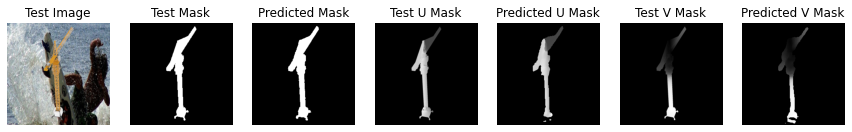

===> Epoch[75/100](0/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3956	Loss_V_Mask: 0.3961
===> Epoch[75/100](1000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.4194	Loss_V_Mask: 0.3567
===> Epoch[75/100](2000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.3721	Loss_V_Mask: 0.3499
===> Epoch[75/100](3000/5000): Loss_Mask: 0.0187	Loss_U_Mask: 0.4225	Loss_V_Mask: 0.3931
===> Epoch[75/100](4000/5000): Loss_Mask: 0.0200	Loss_U_Mask: 0.3467	Loss_V_Mask: 0.3163
===> Epoch[75/100](5000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3193	Loss_V_Mask: 0.2859
Val_Loss_Mask: 0.0285	Val_U_Loss_Mask: 0.4018	Val_V_Loss_Mask: 0.3913


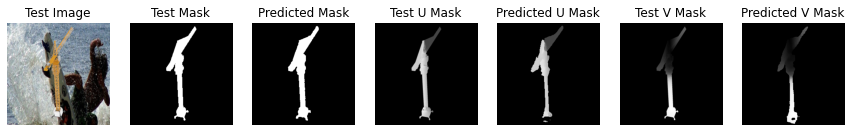

===> Epoch[76/100](0/5000): Loss_Mask: 0.0137	Loss_U_Mask: 0.3216	Loss_V_Mask: 0.2975
===> Epoch[76/100](1000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.4219	Loss_V_Mask: 0.3693
===> Epoch[76/100](2000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3720	Loss_V_Mask: 0.3043
===> Epoch[76/100](3000/5000): Loss_Mask: 0.0197	Loss_U_Mask: 0.4783	Loss_V_Mask: 0.4061
===> Epoch[76/100](4000/5000): Loss_Mask: 0.0264	Loss_U_Mask: 0.4588	Loss_V_Mask: 0.4248
===> Epoch[76/100](5000/5000): Loss_Mask: 0.0108	Loss_U_Mask: 0.3207	Loss_V_Mask: 0.2902
Val_Loss_Mask: 0.0288	Val_U_Loss_Mask: 0.4188	Val_V_Loss_Mask: 0.4087


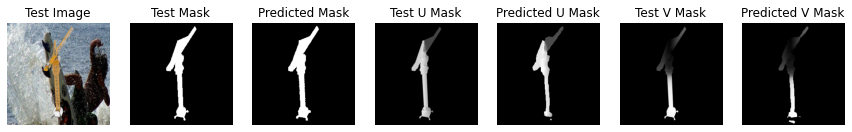

===> Epoch[77/100](0/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3752	Loss_V_Mask: 0.3297
===> Epoch[77/100](1000/5000): Loss_Mask: 0.0174	Loss_U_Mask: 0.3367	Loss_V_Mask: 0.2933
===> Epoch[77/100](2000/5000): Loss_Mask: 0.0193	Loss_U_Mask: 0.4363	Loss_V_Mask: 0.3611
===> Epoch[77/100](3000/5000): Loss_Mask: 0.0171	Loss_U_Mask: 0.4291	Loss_V_Mask: 0.4155
===> Epoch[77/100](4000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3196	Loss_V_Mask: 0.2688
===> Epoch[77/100](5000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3782	Loss_V_Mask: 0.3518
Val_Loss_Mask: 0.0305	Val_U_Loss_Mask: 0.3995	Val_V_Loss_Mask: 0.3809


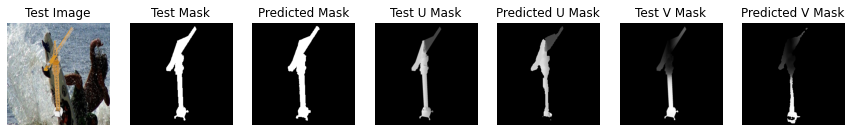

===> Epoch[78/100](0/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3809	Loss_V_Mask: 0.3217
===> Epoch[78/100](1000/5000): Loss_Mask: 0.0092	Loss_U_Mask: 0.2946	Loss_V_Mask: 0.2601
===> Epoch[78/100](2000/5000): Loss_Mask: 0.0098	Loss_U_Mask: 0.2950	Loss_V_Mask: 0.2531
===> Epoch[78/100](3000/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.3525	Loss_V_Mask: 0.2851
===> Epoch[78/100](4000/5000): Loss_Mask: 0.0137	Loss_U_Mask: 0.3393	Loss_V_Mask: 0.2982
===> Epoch[78/100](5000/5000): Loss_Mask: 0.0112	Loss_U_Mask: 0.2886	Loss_V_Mask: 0.2629
Val_Loss_Mask: 0.0288	Val_U_Loss_Mask: 0.3896	Val_V_Loss_Mask: 0.3748


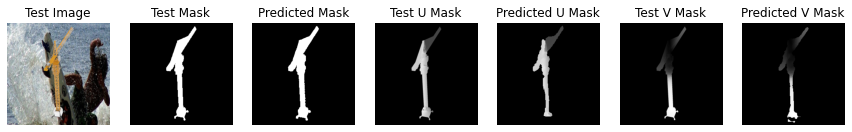

===> Epoch[79/100](0/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3388	Loss_V_Mask: 0.3021
===> Epoch[79/100](1000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3553	Loss_V_Mask: 0.3022
===> Epoch[79/100](2000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.2916	Loss_V_Mask: 0.2641
===> Epoch[79/100](3000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3545	Loss_V_Mask: 0.2871
===> Epoch[79/100](4000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3097	Loss_V_Mask: 0.2639
===> Epoch[79/100](5000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3889	Loss_V_Mask: 0.3222
Val_Loss_Mask: 0.0260	Val_U_Loss_Mask: 0.3954	Val_V_Loss_Mask: 0.3828


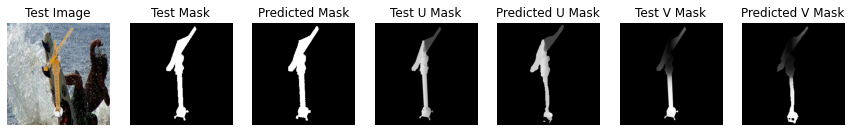

===> Epoch[80/100](0/5000): Loss_Mask: 0.0131	Loss_U_Mask: 0.3859	Loss_V_Mask: 0.3313
===> Epoch[80/100](1000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3750	Loss_V_Mask: 0.3263
===> Epoch[80/100](2000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3291	Loss_V_Mask: 0.2803
===> Epoch[80/100](3000/5000): Loss_Mask: 0.0126	Loss_U_Mask: 0.3983	Loss_V_Mask: 0.3291
===> Epoch[80/100](4000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3527	Loss_V_Mask: 0.3130
===> Epoch[80/100](5000/5000): Loss_Mask: 0.0143	Loss_U_Mask: 0.3555	Loss_V_Mask: 0.2865
Val_Loss_Mask: 0.0265	Val_U_Loss_Mask: 0.3953	Val_V_Loss_Mask: 0.3820


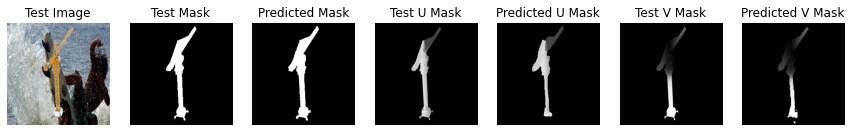

===> Epoch[81/100](0/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3141	Loss_V_Mask: 0.2690
===> Epoch[81/100](1000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3279	Loss_V_Mask: 0.2927
===> Epoch[81/100](2000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3151	Loss_V_Mask: 0.2679
===> Epoch[81/100](3000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3797	Loss_V_Mask: 0.3152
===> Epoch[81/100](4000/5000): Loss_Mask: 0.0105	Loss_U_Mask: 0.3503	Loss_V_Mask: 0.2802
===> Epoch[81/100](5000/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.3652	Loss_V_Mask: 0.3129
Val_Loss_Mask: 0.0292	Val_U_Loss_Mask: 0.4153	Val_V_Loss_Mask: 0.4074


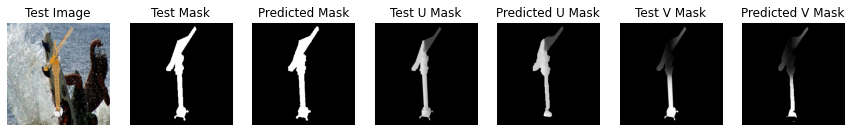

===> Epoch[82/100](0/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3362	Loss_V_Mask: 0.3187
===> Epoch[82/100](1000/5000): Loss_Mask: 0.0209	Loss_U_Mask: 0.4498	Loss_V_Mask: 0.4220
===> Epoch[82/100](2000/5000): Loss_Mask: 0.0130	Loss_U_Mask: 0.3089	Loss_V_Mask: 0.2823
===> Epoch[82/100](3000/5000): Loss_Mask: 0.0107	Loss_U_Mask: 0.3870	Loss_V_Mask: 0.3040
===> Epoch[82/100](4000/5000): Loss_Mask: 0.0162	Loss_U_Mask: 0.3439	Loss_V_Mask: 0.2812
===> Epoch[82/100](5000/5000): Loss_Mask: 0.0181	Loss_U_Mask: 0.3439	Loss_V_Mask: 0.2987
Val_Loss_Mask: 0.0267	Val_U_Loss_Mask: 0.3855	Val_V_Loss_Mask: 0.3613


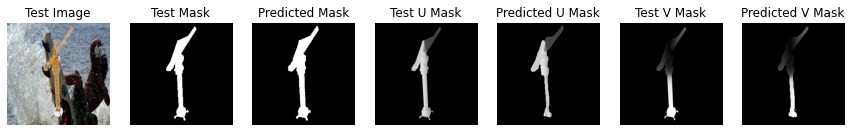

===> Epoch[83/100](0/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3507	Loss_V_Mask: 0.3366
===> Epoch[83/100](1000/5000): Loss_Mask: 0.0095	Loss_U_Mask: 0.3773	Loss_V_Mask: 0.3361
===> Epoch[83/100](2000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3828	Loss_V_Mask: 0.3278
===> Epoch[83/100](3000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.3651	Loss_V_Mask: 0.3154
===> Epoch[83/100](4000/5000): Loss_Mask: 0.0081	Loss_U_Mask: 0.2975	Loss_V_Mask: 0.2685
===> Epoch[83/100](5000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.2941	Loss_V_Mask: 0.2516
Val_Loss_Mask: 0.0317	Val_U_Loss_Mask: 0.4593	Val_V_Loss_Mask: 0.4350


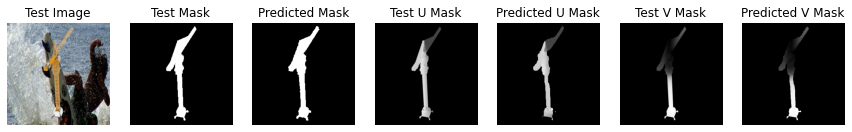

===> Epoch[84/100](0/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3272	Loss_V_Mask: 0.2659
===> Epoch[84/100](1000/5000): Loss_Mask: 0.0158	Loss_U_Mask: 0.3344	Loss_V_Mask: 0.2935
===> Epoch[84/100](2000/5000): Loss_Mask: 0.0188	Loss_U_Mask: 0.3671	Loss_V_Mask: 0.3195
===> Epoch[84/100](3000/5000): Loss_Mask: 0.0205	Loss_U_Mask: 0.3479	Loss_V_Mask: 0.3030
===> Epoch[84/100](4000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3755	Loss_V_Mask: 0.3358
===> Epoch[84/100](5000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3836	Loss_V_Mask: 0.3109
Val_Loss_Mask: 0.0274	Val_U_Loss_Mask: 0.3903	Val_V_Loss_Mask: 0.3712


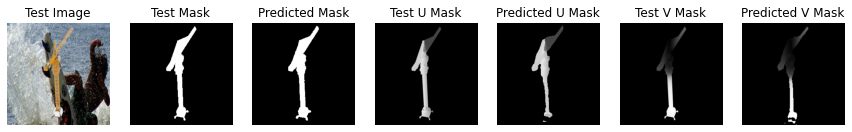

===> Epoch[85/100](0/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3427	Loss_V_Mask: 0.2985
===> Epoch[85/100](1000/5000): Loss_Mask: 0.0170	Loss_U_Mask: 0.4049	Loss_V_Mask: 0.3871
===> Epoch[85/100](2000/5000): Loss_Mask: 0.0158	Loss_U_Mask: 0.3085	Loss_V_Mask: 0.2895
===> Epoch[85/100](3000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.4541	Loss_V_Mask: 0.3910
===> Epoch[85/100](4000/5000): Loss_Mask: 0.0164	Loss_U_Mask: 0.3398	Loss_V_Mask: 0.2862
===> Epoch[85/100](5000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3673	Loss_V_Mask: 0.2946
Val_Loss_Mask: 0.0287	Val_U_Loss_Mask: 0.4149	Val_V_Loss_Mask: 0.4094


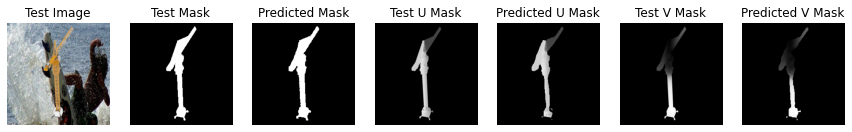

===> Epoch[86/100](0/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.4053	Loss_V_Mask: 0.3630
===> Epoch[86/100](1000/5000): Loss_Mask: 0.0114	Loss_U_Mask: 0.3934	Loss_V_Mask: 0.3435
===> Epoch[86/100](2000/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.2977	Loss_V_Mask: 0.2445
===> Epoch[86/100](3000/5000): Loss_Mask: 0.0287	Loss_U_Mask: 0.4348	Loss_V_Mask: 0.4005
===> Epoch[86/100](4000/5000): Loss_Mask: 0.0138	Loss_U_Mask: 0.3386	Loss_V_Mask: 0.2986
===> Epoch[86/100](5000/5000): Loss_Mask: 0.0145	Loss_U_Mask: 0.3929	Loss_V_Mask: 0.3508
Val_Loss_Mask: 0.0268	Val_U_Loss_Mask: 0.4165	Val_V_Loss_Mask: 0.4077


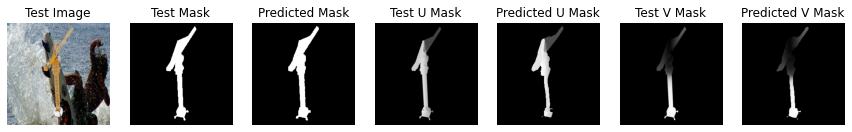

===> Epoch[87/100](0/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3585	Loss_V_Mask: 0.2928
===> Epoch[87/100](1000/5000): Loss_Mask: 0.0187	Loss_U_Mask: 0.3350	Loss_V_Mask: 0.2765
===> Epoch[87/100](2000/5000): Loss_Mask: 0.0157	Loss_U_Mask: 0.3758	Loss_V_Mask: 0.3238
===> Epoch[87/100](3000/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.3526	Loss_V_Mask: 0.2893
===> Epoch[87/100](4000/5000): Loss_Mask: 0.0102	Loss_U_Mask: 0.2591	Loss_V_Mask: 0.2266
===> Epoch[87/100](5000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3666	Loss_V_Mask: 0.3341
Val_Loss_Mask: 0.0250	Val_U_Loss_Mask: 0.4098	Val_V_Loss_Mask: 0.3860


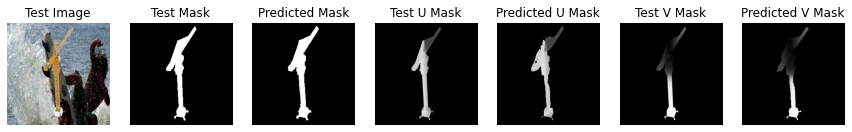

===> Epoch[88/100](0/5000): Loss_Mask: 0.0171	Loss_U_Mask: 0.3639	Loss_V_Mask: 0.3297
===> Epoch[88/100](1000/5000): Loss_Mask: 0.0150	Loss_U_Mask: 0.3772	Loss_V_Mask: 0.3637
===> Epoch[88/100](2000/5000): Loss_Mask: 0.0091	Loss_U_Mask: 0.2888	Loss_V_Mask: 0.2403
===> Epoch[88/100](3000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3797	Loss_V_Mask: 0.3123
===> Epoch[88/100](4000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3706	Loss_V_Mask: 0.3265
===> Epoch[88/100](5000/5000): Loss_Mask: 0.0149	Loss_U_Mask: 0.2943	Loss_V_Mask: 0.2669
Val_Loss_Mask: 0.0255	Val_U_Loss_Mask: 0.3992	Val_V_Loss_Mask: 0.3804


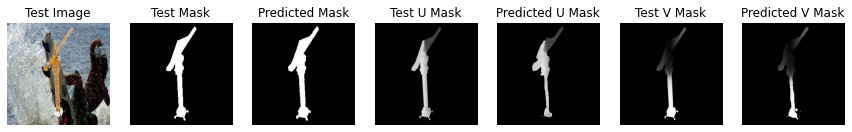

===> Epoch[89/100](0/5000): Loss_Mask: 0.0084	Loss_U_Mask: 0.3306	Loss_V_Mask: 0.3087
===> Epoch[89/100](1000/5000): Loss_Mask: 0.0179	Loss_U_Mask: 0.3802	Loss_V_Mask: 0.3498
===> Epoch[89/100](2000/5000): Loss_Mask: 0.0146	Loss_U_Mask: 0.3573	Loss_V_Mask: 0.3098
===> Epoch[89/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3432	Loss_V_Mask: 0.3177
===> Epoch[89/100](4000/5000): Loss_Mask: 0.0109	Loss_U_Mask: 0.3317	Loss_V_Mask: 0.2625
===> Epoch[89/100](5000/5000): Loss_Mask: 0.0140	Loss_U_Mask: 0.3388	Loss_V_Mask: 0.2890
Val_Loss_Mask: 0.0297	Val_U_Loss_Mask: 0.3947	Val_V_Loss_Mask: 0.3789


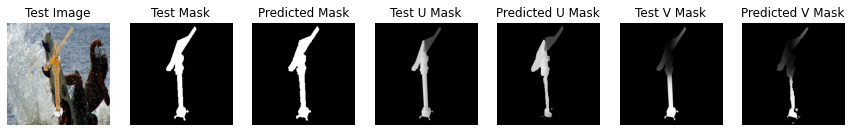

===> Epoch[90/100](0/5000): Loss_Mask: 0.0161	Loss_U_Mask: 0.3895	Loss_V_Mask: 0.4046
===> Epoch[90/100](1000/5000): Loss_Mask: 0.0191	Loss_U_Mask: 0.3190	Loss_V_Mask: 0.2871
===> Epoch[90/100](2000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3046	Loss_V_Mask: 0.2678
===> Epoch[90/100](3000/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3522	Loss_V_Mask: 0.3054
===> Epoch[90/100](4000/5000): Loss_Mask: 0.0292	Loss_U_Mask: 0.3811	Loss_V_Mask: 0.3616
===> Epoch[90/100](5000/5000): Loss_Mask: 0.0165	Loss_U_Mask: 0.3311	Loss_V_Mask: 0.3001
Val_Loss_Mask: 0.0257	Val_U_Loss_Mask: 0.4119	Val_V_Loss_Mask: 0.4069


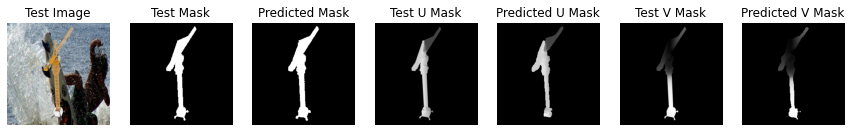

===> Epoch[91/100](0/5000): Loss_Mask: 0.0166	Loss_U_Mask: 0.3636	Loss_V_Mask: 0.2946
===> Epoch[91/100](1000/5000): Loss_Mask: 0.0527	Loss_U_Mask: 0.4644	Loss_V_Mask: 0.4239
===> Epoch[91/100](2000/5000): Loss_Mask: 0.0136	Loss_U_Mask: 0.3341	Loss_V_Mask: 0.2530
===> Epoch[91/100](3000/5000): Loss_Mask: 0.0115	Loss_U_Mask: 0.3486	Loss_V_Mask: 0.3016
===> Epoch[91/100](4000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3237	Loss_V_Mask: 0.2665
===> Epoch[91/100](5000/5000): Loss_Mask: 0.0180	Loss_U_Mask: 0.3453	Loss_V_Mask: 0.2779
Val_Loss_Mask: 0.0260	Val_U_Loss_Mask: 0.4115	Val_V_Loss_Mask: 0.4068


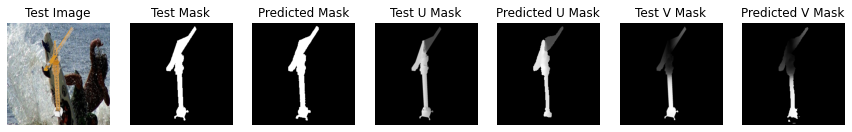

===> Epoch[92/100](0/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3666	Loss_V_Mask: 0.3191
===> Epoch[92/100](1000/5000): Loss_Mask: 0.0160	Loss_U_Mask: 0.3435	Loss_V_Mask: 0.3200
===> Epoch[92/100](2000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3092	Loss_V_Mask: 0.2880
===> Epoch[92/100](3000/5000): Loss_Mask: 0.0101	Loss_U_Mask: 0.3293	Loss_V_Mask: 0.2899
===> Epoch[92/100](4000/5000): Loss_Mask: 0.0203	Loss_U_Mask: 0.3102	Loss_V_Mask: 0.2926
===> Epoch[92/100](5000/5000): Loss_Mask: 0.0119	Loss_U_Mask: 0.3509	Loss_V_Mask: 0.2919
Val_Loss_Mask: 0.0256	Val_U_Loss_Mask: 0.4137	Val_V_Loss_Mask: 0.3953


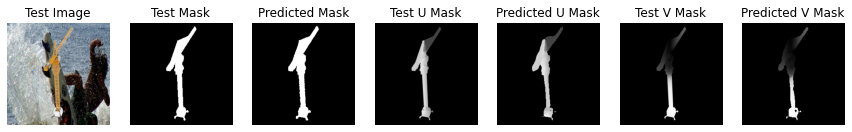

===> Epoch[93/100](0/5000): Loss_Mask: 0.0111	Loss_U_Mask: 0.2926	Loss_V_Mask: 0.2757
===> Epoch[93/100](1000/5000): Loss_Mask: 0.0142	Loss_U_Mask: 0.3650	Loss_V_Mask: 0.2880
===> Epoch[93/100](2000/5000): Loss_Mask: 0.0099	Loss_U_Mask: 0.3077	Loss_V_Mask: 0.2507
===> Epoch[93/100](3000/5000): Loss_Mask: 0.0252	Loss_U_Mask: 0.3940	Loss_V_Mask: 0.3455
===> Epoch[93/100](4000/5000): Loss_Mask: 0.0132	Loss_U_Mask: 0.3721	Loss_V_Mask: 0.3206
===> Epoch[93/100](5000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3245	Loss_V_Mask: 0.2754
Val_Loss_Mask: 0.0275	Val_U_Loss_Mask: 0.3953	Val_V_Loss_Mask: 0.3744


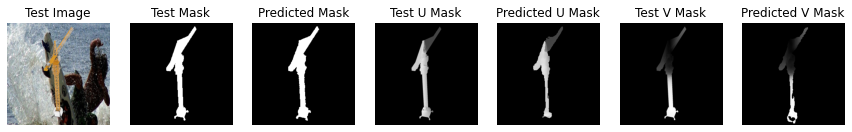

===> Epoch[94/100](0/5000): Loss_Mask: 0.0157	Loss_U_Mask: 0.3528	Loss_V_Mask: 0.3136
===> Epoch[94/100](1000/5000): Loss_Mask: 0.0116	Loss_U_Mask: 0.3397	Loss_V_Mask: 0.3007
===> Epoch[94/100](2000/5000): Loss_Mask: 0.0207	Loss_U_Mask: 0.3098	Loss_V_Mask: 0.2735
===> Epoch[94/100](3000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.3422	Loss_V_Mask: 0.2775
===> Epoch[94/100](4000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3699	Loss_V_Mask: 0.3358
===> Epoch[94/100](5000/5000): Loss_Mask: 0.0123	Loss_U_Mask: 0.3233	Loss_V_Mask: 0.2666
Val_Loss_Mask: 0.0275	Val_U_Loss_Mask: 0.4088	Val_V_Loss_Mask: 0.4077


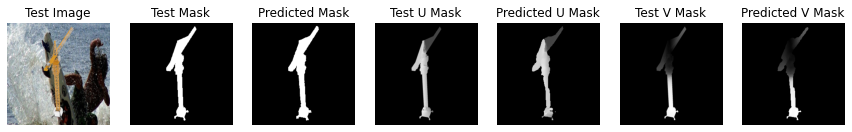

===> Epoch[95/100](0/5000): Loss_Mask: 0.0192	Loss_U_Mask: 0.4018	Loss_V_Mask: 0.3251
===> Epoch[95/100](1000/5000): Loss_Mask: 0.0144	Loss_U_Mask: 0.3607	Loss_V_Mask: 0.3210
===> Epoch[95/100](2000/5000): Loss_Mask: 0.0147	Loss_U_Mask: 0.3780	Loss_V_Mask: 0.3193
===> Epoch[95/100](3000/5000): Loss_Mask: 0.0100	Loss_U_Mask: 0.3390	Loss_V_Mask: 0.2834
===> Epoch[95/100](4000/5000): Loss_Mask: 0.0153	Loss_U_Mask: 0.4400	Loss_V_Mask: 0.3783
===> Epoch[95/100](5000/5000): Loss_Mask: 0.0162	Loss_U_Mask: 0.3286	Loss_V_Mask: 0.2791
Val_Loss_Mask: 0.0241	Val_U_Loss_Mask: 0.3965	Val_V_Loss_Mask: 0.3766


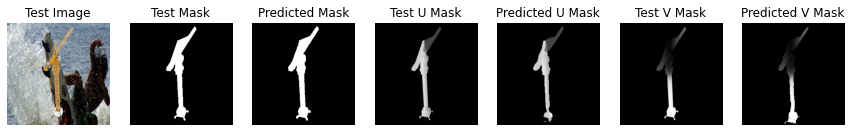

===> Epoch[96/100](0/5000): Loss_Mask: 0.0129	Loss_U_Mask: 0.3616	Loss_V_Mask: 0.3297
===> Epoch[96/100](1000/5000): Loss_Mask: 0.0141	Loss_U_Mask: 0.3984	Loss_V_Mask: 0.3386
===> Epoch[96/100](2000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3498	Loss_V_Mask: 0.3435
===> Epoch[96/100](3000/5000): Loss_Mask: 0.0104	Loss_U_Mask: 0.3458	Loss_V_Mask: 0.3035
===> Epoch[96/100](4000/5000): Loss_Mask: 0.0120	Loss_U_Mask: 0.3461	Loss_V_Mask: 0.2744
===> Epoch[96/100](5000/5000): Loss_Mask: 0.0121	Loss_U_Mask: 0.3622	Loss_V_Mask: 0.3030
Val_Loss_Mask: 0.0337	Val_U_Loss_Mask: 0.3947	Val_V_Loss_Mask: 0.3820


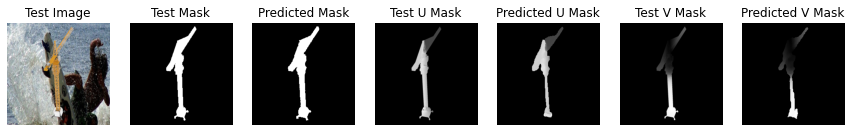

===> Epoch[97/100](0/5000): Loss_Mask: 0.0139	Loss_U_Mask: 0.3900	Loss_V_Mask: 0.3461
===> Epoch[97/100](1000/5000): Loss_Mask: 0.0093	Loss_U_Mask: 0.3441	Loss_V_Mask: 0.3046
===> Epoch[97/100](2000/5000): Loss_Mask: 0.0193	Loss_U_Mask: 0.3383	Loss_V_Mask: 0.3024
===> Epoch[97/100](3000/5000): Loss_Mask: 0.0106	Loss_U_Mask: 0.3117	Loss_V_Mask: 0.2581
===> Epoch[97/100](4000/5000): Loss_Mask: 0.0159	Loss_U_Mask: 0.3338	Loss_V_Mask: 0.2701
===> Epoch[97/100](5000/5000): Loss_Mask: 0.0127	Loss_U_Mask: 0.4042	Loss_V_Mask: 0.3210
Val_Loss_Mask: 0.0272	Val_U_Loss_Mask: 0.4020	Val_V_Loss_Mask: 0.3733


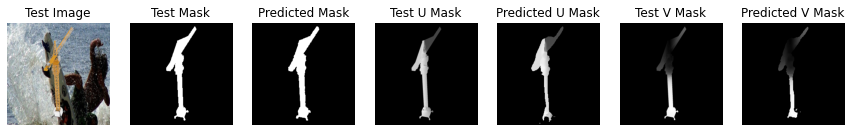

===> Epoch[98/100](0/5000): Loss_Mask: 0.0163	Loss_U_Mask: 0.3271	Loss_V_Mask: 0.2798
===> Epoch[98/100](1000/5000): Loss_Mask: 0.0167	Loss_U_Mask: 0.3631	Loss_V_Mask: 0.3140
===> Epoch[98/100](2000/5000): Loss_Mask: 0.0148	Loss_U_Mask: 0.3518	Loss_V_Mask: 0.3022
===> Epoch[98/100](3000/5000): Loss_Mask: 0.0124	Loss_U_Mask: 0.3183	Loss_V_Mask: 0.2546
===> Epoch[98/100](4000/5000): Loss_Mask: 0.0133	Loss_U_Mask: 0.3702	Loss_V_Mask: 0.3360
===> Epoch[98/100](5000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3193	Loss_V_Mask: 0.2784
Val_Loss_Mask: 0.0312	Val_U_Loss_Mask: 0.4016	Val_V_Loss_Mask: 0.3920


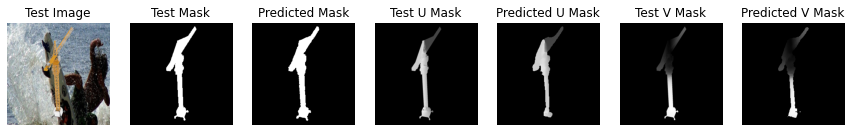

===> Epoch[99/100](0/5000): Loss_Mask: 0.0154	Loss_U_Mask: 0.4381	Loss_V_Mask: 0.3398
===> Epoch[99/100](1000/5000): Loss_Mask: 0.0110	Loss_U_Mask: 0.3576	Loss_V_Mask: 0.3111
===> Epoch[99/100](2000/5000): Loss_Mask: 0.0157	Loss_U_Mask: 0.4054	Loss_V_Mask: 0.3441
===> Epoch[99/100](3000/5000): Loss_Mask: 0.0103	Loss_U_Mask: 0.3357	Loss_V_Mask: 0.3045
===> Epoch[99/100](4000/5000): Loss_Mask: 0.0113	Loss_U_Mask: 0.3185	Loss_V_Mask: 0.2757
===> Epoch[99/100](5000/5000): Loss_Mask: 0.0122	Loss_U_Mask: 0.3485	Loss_V_Mask: 0.2996
Val_Loss_Mask: 0.0314	Val_U_Loss_Mask: 0.4083	Val_V_Loss_Mask: 0.3932


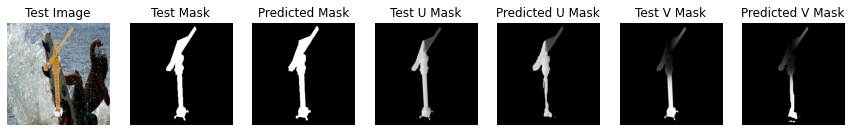

===> Epoch[100/100](0/5000): Loss_Mask: 0.0137	Loss_U_Mask: 0.3413	Loss_V_Mask: 0.3009
===> Epoch[100/100](1000/5000): Loss_Mask: 0.0134	Loss_U_Mask: 0.3124	Loss_V_Mask: 0.2834
===> Epoch[100/100](2000/5000): Loss_Mask: 0.0314	Loss_U_Mask: 0.4067	Loss_V_Mask: 0.3759
===> Epoch[100/100](3000/5000): Loss_Mask: 0.0128	Loss_U_Mask: 0.3554	Loss_V_Mask: 0.2854
===> Epoch[100/100](4000/5000): Loss_Mask: 0.0172	Loss_U_Mask: 0.3263	Loss_V_Mask: 0.2999
===> Epoch[100/100](5000/5000): Loss_Mask: 0.0125	Loss_U_Mask: 0.3557	Loss_V_Mask: 0.3007
Val_Loss_Mask: 0.0324	Val_U_Loss_Mask: 0.3929	Val_V_Loss_Mask: 0.3807


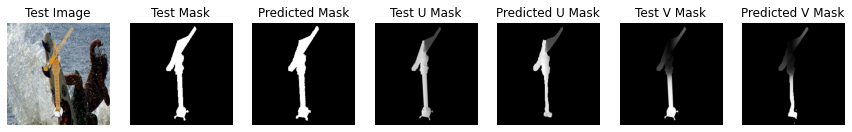

In [21]:
train_avg_mask_losses = []
val_avg_mask_losses = []
train_avg_u_mask_losses = []
val_avg_u_mask_losses = []
train_avg_v_mask_losses = []
val_avg_v_mask_losses = []


for epoch in range(params['epoch_count'], params['epochs'] + 1):
    # train
    correspondence_block.to(device).train()
    cut_num = 5000 # 1epoch = cut_num x batch_size
    
    train_mask_losses = []
    val_mask_losses = []
    train_u_mask_losses = []
    val_u_mask_losses = []
    train_v_mask_losses = []
    val_v_mask_losses = []
    
    for iteration, (batch) in enumerate(train_data_loader):
        
        image, mask, u_mask, v_mask = batch[0].to(device), batch[1].to(device), batch[2].to(device), batch[3].to(device)
        mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)

        optimizer.zero_grad()
 
        #loss
        loss_m = criterion_m(mask_pred.type(torch.double), mask.type(torch.long))
        loss_u = criterion_u(u_mask_pred.type(torch.double), u_mask)
        loss_v = criterion_v(v_mask_pred.type(torch.double), v_mask)
        loss = loss_m + loss_u + loss_v
        
        loss.backward()
        optimizer.step()
        
        # loss values
        train_mask_losses.append(loss_m.item())
        train_u_mask_losses.append(loss_u.item())
        train_v_mask_losses.append(loss_v.item())

        if iteration % params['log_interval'] == 0:
            print("===> Epoch[{}/{}]({}/{}): Loss_Mask: {:.4f}\tLoss_U_Mask: {:.4f}\tLoss_V_Mask: {:.4f}".format(
                epoch, params['epochs'],iteration, cut_num, loss_m.item(), loss_u.item(), loss_v.item()))
        
        if iteration == cut_num:
            break
        
    # avg loss values for plot
    train_avg_mask_loss = torch.mean(torch.FloatTensor(train_mask_losses)) 
    train_avg_u_mask_loss = torch.mean(torch.FloatTensor(train_u_mask_losses))
    train_avg_v_mask_loss = torch.mean(torch.FloatTensor(train_v_mask_losses))
    train_avg_mask_losses.append(train_avg_mask_loss.item())
    train_avg_u_mask_losses.append(train_avg_u_mask_loss.item())
    train_avg_v_mask_losses.append(train_avg_v_mask_loss.item())

    correspondence_block.to(device).eval()
    
    with torch.no_grad():
        for iteration, (batch) in enumerate(val_data_loader):
            
            image, mask, u_mask, v_mask = batch[0].to(device), batch[1].to(device), batch[2].to(device), batch[3].to(device)
            mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)

            #loss
            loss_m = criterion_m(mask_pred.type(torch.double), mask.type(torch.long))
            loss_u = criterion_u(u_mask_pred.type(torch.double), u_mask)
            loss_v = criterion_v(v_mask_pred.type(torch.double), v_mask)
            loss = loss_m + loss_u + loss_v

            val_mask_losses.append(loss_m.item())
            val_u_mask_losses.append(loss_u.item())
            val_v_mask_losses.append(loss_v.item())
    
    # avg loss values for plot
    val_avg_mask_loss = torch.mean(torch.FloatTensor(val_mask_losses))
    val_avg_u_mask_loss = torch.mean(torch.FloatTensor(val_u_mask_losses))
    val_avg_v_mask_loss = torch.mean(torch.FloatTensor(val_v_mask_losses))
    val_avg_mask_losses.append(val_avg_mask_loss.item())
    val_avg_u_mask_losses.append(val_avg_u_mask_loss.item())
    val_avg_v_mask_losses.append(val_avg_v_mask_loss.item())
    
    print("Val_Loss_Mask: {:.4f}\tVal_U_Loss_Mask: {:.4f}\tVal_V_Loss_Mask: {:.4f}".format(val_avg_mask_loss.item(),
            val_avg_u_mask_loss.item(), val_avg_v_mask_loss.item()))
    
    # Show result for test image
    image = val_image.to(device)
    mask = val_mask.to(device)
    u_mask = val_u_mask.to(device)
    v_mask = val_v_mask.to(device)
    mask_pred, u_mask_pred, v_mask_pred = correspondence_block(image)
    
    plot_train_result([image, mask, mask_pred, u_mask, u_mask_pred, v_mask, v_mask_pred], epoch, save=False)
    
    # Save weight
    if epoch % 1 == 0:
        torch.save(correspondence_block.state_dict(), checkpoint_path+'/cpb-%s.pt'%epoch)

In [22]:
print('Mask Loss :',np.array(val_avg_mask_losses).argmin()+1, val_avg_mask_losses[np.array(val_avg_mask_losses).argmin()],
      '\tU Mask Loss :',np.array(val_avg_u_mask_losses).argmin()+1, val_avg_u_mask_losses[np.array(val_avg_u_mask_losses).argmin()],
      '\tV Mask Loss :',np.array(val_avg_v_mask_losses).argmin()+1, val_avg_v_mask_losses[np.array(val_avg_v_mask_losses).argmin()])

Mask Loss : 95 0.02405242808163166 	U Mask Loss : 74 0.37649309635162354 	V Mask Loss : 10 0.35638105869293213


# Loss Curve

In [23]:
csvfile=open('./loss/train_u_mask_loss_cpb_unet.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_u_mask_losses).reshape(len(train_avg_u_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('./loss/val_u_mask_loss_cpb_unet.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_u_mask_losses).reshape(len(val_avg_u_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()
                    
csvfile=open('./loss/train_v_mask_loss_cpb_unet.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_v_mask_losses).reshape(len(train_avg_v_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('./loss/val_v_mask_loss_cpb_unet.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_v_mask_losses).reshape(len(val_avg_v_mask_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

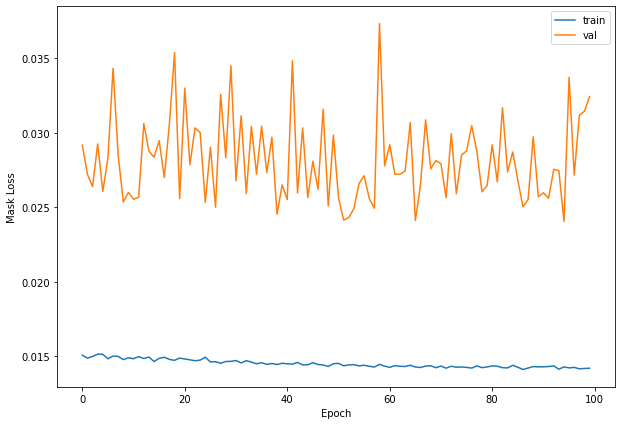

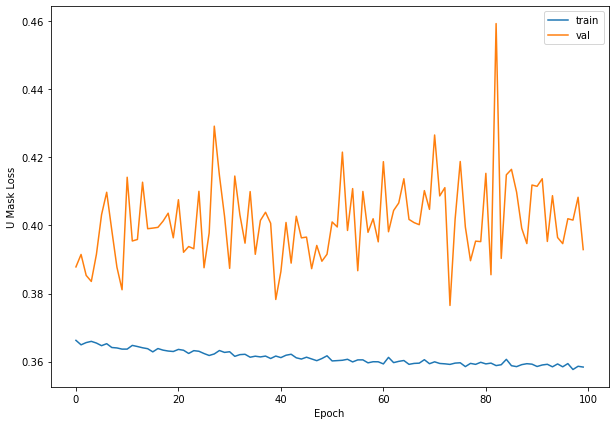

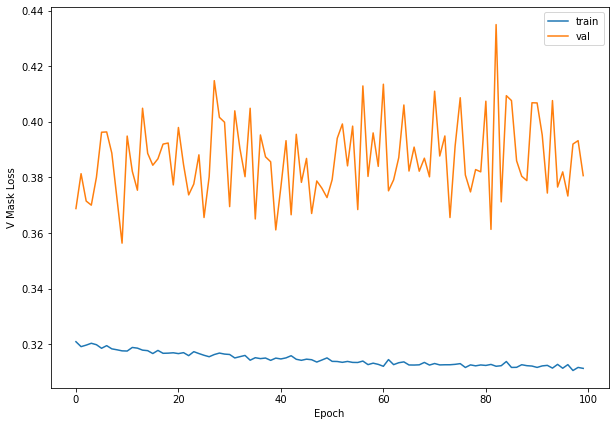

In [24]:
plt.figure(figsize=(10,7))
plt.plot(train_avg_mask_losses, label='train')
plt.plot(val_avg_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('Mask Loss')
plt.legend()

plt.figure(figsize=(10,7))
plt.plot(train_avg_u_mask_losses, label='train')
plt.plot(val_avg_u_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('U Mask Loss')
plt.legend()

plt.figure(figsize=(10,7))
plt.plot(train_avg_v_mask_losses, label='train')
plt.plot(val_avg_v_mask_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('V Mask Loss')
plt.legend()

# Restore Checkpoint

In [40]:
weight_dict = torch.load(checkpoint_path+'/cpb-100.pt')

In [41]:
correspondence_block.load_state_dict(weight_dict)

<All keys matched successfully>

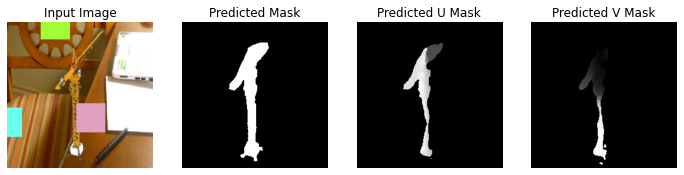

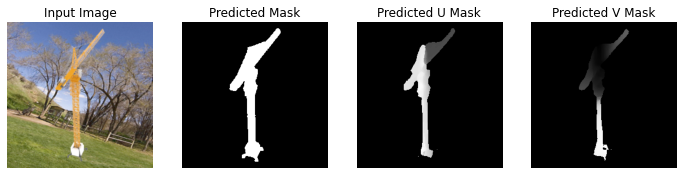

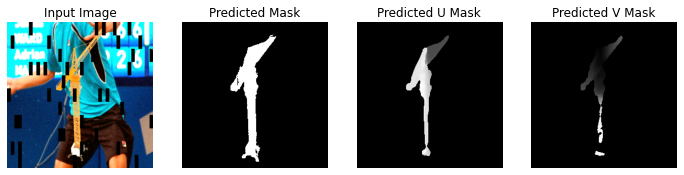

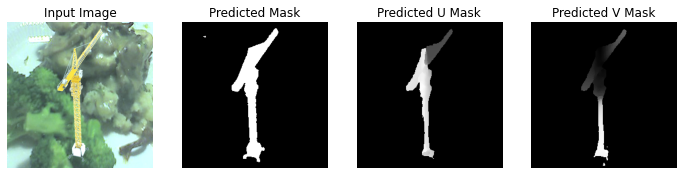

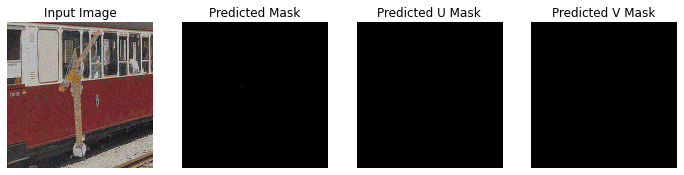

...

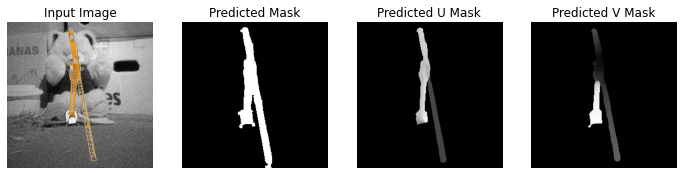

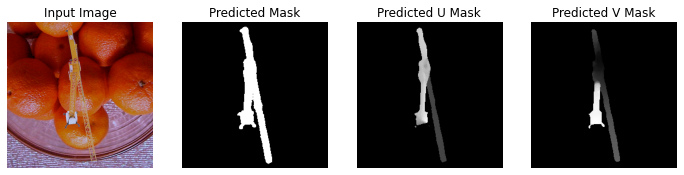

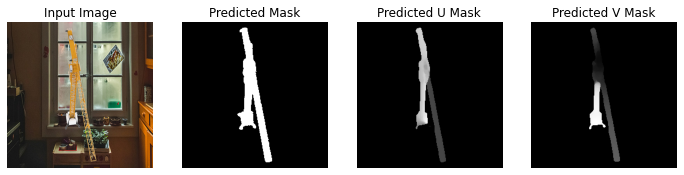

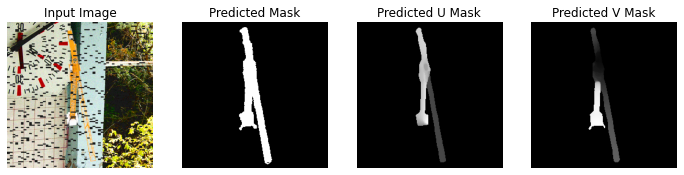

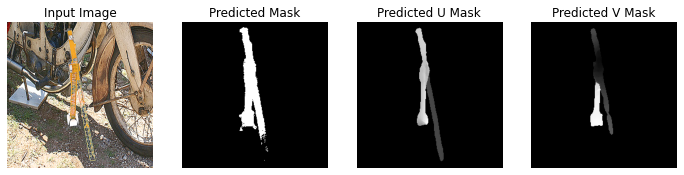

In [42]:
for path in train_image_paths[:50]:
    visualization(correspondence_block, path)

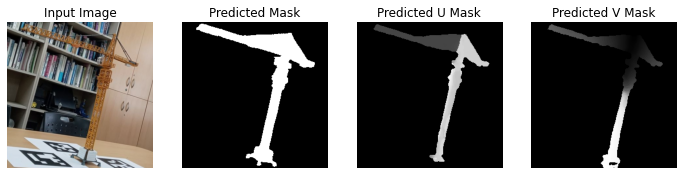

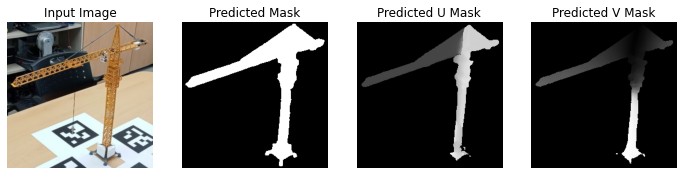

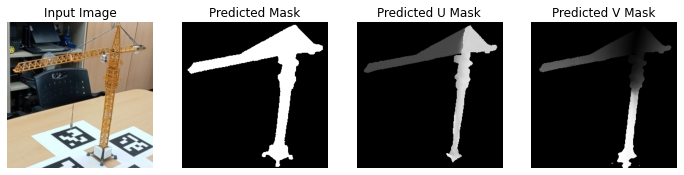

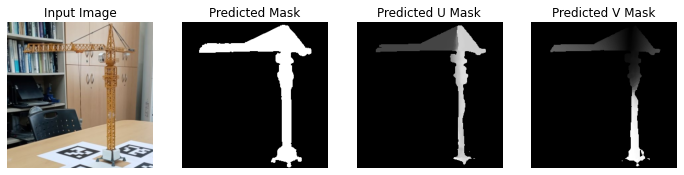

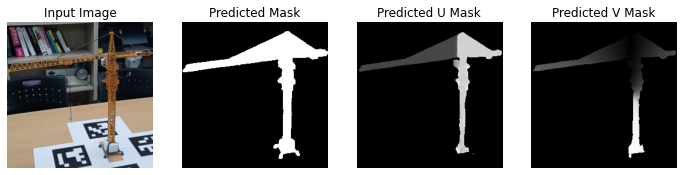

...

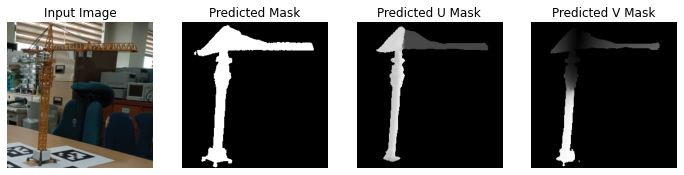

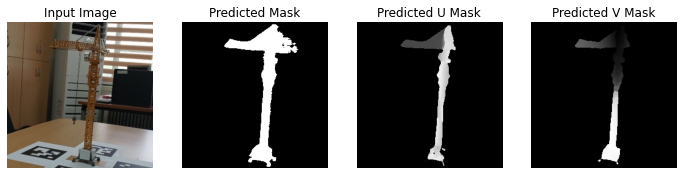

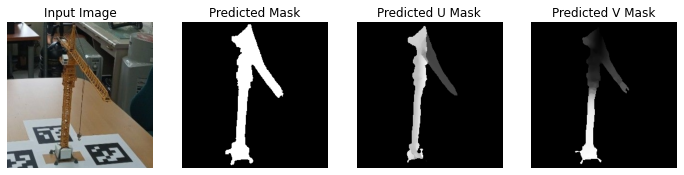

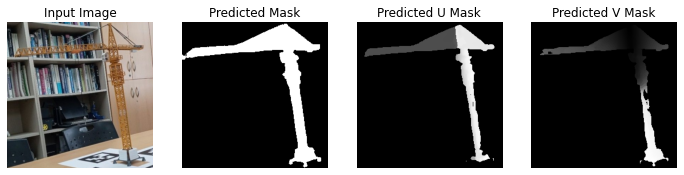

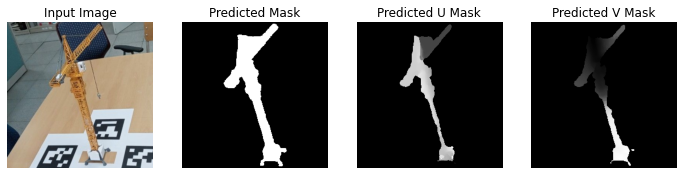

In [44]:
test_path = glob('C:/Users/IVCL/Desktop/crane/real_image_crop/*.png')
for path in test_path:
    visualization(correspondence_block, path)

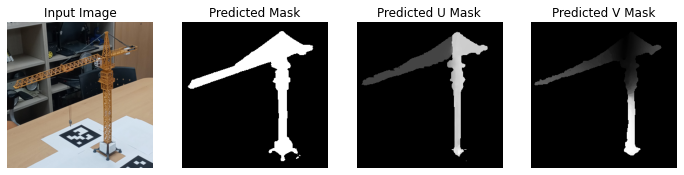

In [24]:
test_path = 'C:/Users/IVCL/Desktop/creal_0001.png'
visualization(correspondence_block, test_path)
correspondence_block.eval()
correspondence_block.to(device)
transform = transforms.Compose([transforms.ToTensor(),
                            transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0)])

image = cv2.imread(test_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
image= transform(image).unsqueeze_(0)
mask, u_mask, v_mask = correspondence_block(image)

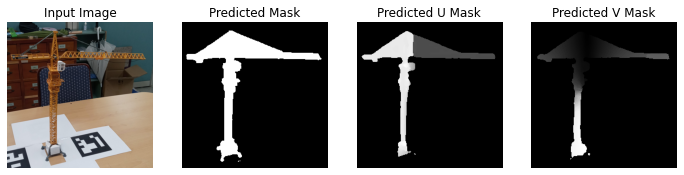

In [25]:
test_path = 'C:/Users/IVCL/Desktop/creal_0093.png'
visualization(correspondence_block, test_path)
correspondence_block.eval()
correspondence_block.to(device)
transform = transforms.Compose([transforms.ToTensor(),
                            transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0)])

image = cv2.imread(test_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
image= transform(image).unsqueeze_(0)
mask, u_mask, v_mask = correspondence_block(image)

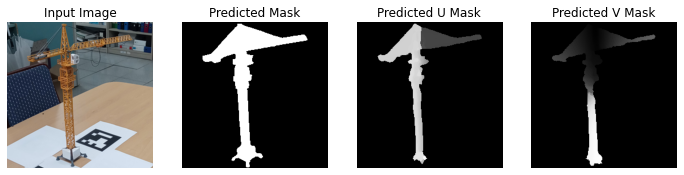

In [26]:
test_path = 'C:/Users/IVCL/Desktop/creal_0085.png'
visualization(correspondence_block, test_path)
correspondence_block.eval()
correspondence_block.to(device)
transform = transforms.Compose([transforms.ToTensor(),
                            transforms.ColorJitter(brightness=0, contrast=0, saturation=0, hue=0)])

image = cv2.imread(test_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, (params['input_size'], params['input_size']), cv2.INTER_CUBIC)
image= transform(image).unsqueeze_(0)
mask, u_mask, v_mask = correspondence_block(image)

In [21]:
mask = F.interpolate(mask, 512)
u_mask = F.interpolate(u_mask, 512)
v_mask = F.interpolate(v_mask, 512)

In [22]:
temp = torch.argmax(mask, dim=1).squeeze().cpu()
upred = torch.argmax(u_mask, dim=1).squeeze().cpu()
vpred = torch.argmax(v_mask, dim=1).squeeze().cpu()

coord_2d = (temp == 1).nonzero(as_tuple=True)

coord_2d = torch.cat((coord_2d[0].view(
    coord_2d[0].shape[0], 1), coord_2d[1].view(coord_2d[1].shape[0], 1)), 1)
uvalues = upred[coord_2d[:, 0], coord_2d[:, 1]]
vvalues = vpred[coord_2d[:, 0], coord_2d[:, 1]]
dct_keys = torch.cat((uvalues.view(-1, 1), vvalues.view(-1, 1)), 1)
dct_keys = tuple(dct_keys.numpy())
dct = load_obj("./UV-XYZ_mapping")

In [23]:
fx = 595.259627
px = 255.312872
fy = 551.317594
py = 223.823052

intrinsic_matrix = np.array([[fx, 0, px], [0, fy, py], [0, 0, 1]])

camera_rigid_transformation = np.array([[ 0.9999970197677612, -8.742251367266363e-08, -0.00243386160582304, 0.006821606773883104],
        [-8.742275525719378e-08, -0.9999997615814209, -1.3877781190369556e-17, -0.018590735271573067],
        [-0.0024338611401617527, 2.1277490880322603e-10, -0.9999967813491821, 0.09084007143974304],
        [0, 0, 0, 1]])
mapping_2d = []
mapping_3d = []
for count, (u, v) in enumerate(dct_keys):
    if (u, v) in dct:
        mapping_2d.append(np.array(coord_2d[count]))
        mapping_3d.append(dct[(u, v)])
# Get the 6D pose from rotation and translation matrices
# PnP needs atleast 6 unique 2D-3D correspondences to run
if len(mapping_2d) >= 4 or len(mapping_3d) >= 4:
    _, rvecs, tvecs, inliers = cv2.solvePnPRansac(np.array(mapping_3d, dtype=np.float32),
                                                  np.array(mapping_2d, dtype=np.float32), intrinsic_matrix, distCoeffs=None,
                                                  iterationsCount=300, reprojectionError=1.0, flags=cv2.SOLVEPNP_P3P)

In [24]:
ry = (R.from_euler('y', 90, degrees=True)).as_dcm()
rz = (R.from_euler('z', 90, degrees=True)).as_dcm()
rx = (R.from_euler('x', 90, degrees=True)).as_dcm()
rvecs_dcm = R.from_rotvec(rvecs.squeeze()).as_dcm()
rigid_transformation = np.append(rvecs_dcm, tvecs, axis=1)
rigid_transformation = np.append(rigid_transformation, [[0,0,0,1]], axis=0)

In [25]:
rigid_transformation_rf = inv(camera_rigid_transformation) @ rigid_transformation

In [26]:
# blender
R.from_dcm(rz@rigid_transformation_rf[:3,:3]).as_quat()

array([0.82922494, 0.03780372, 0.51317383, 0.21819601])

In [93]:
# real
R.from_dcm(inv(rz)@inv(ry)@rz@rigid_transformation_rf[:3,:3]).as_quat()

array([ 0.06782948, -0.24822175,  0.5431995 ,  0.79919924])

In [94]:
rz@rigid_transformation_rf[:3,3]

array([ 0.21039609,  0.25722592, -0.74037724])